In [1]:
import pandas as pd
import numpy as np
from scipy.stats import gaussian_kde
from matplotlib.colors import LogNorm
import matplotlib.pyplot as plt
import os
import seaborn as sns
import anndata as ad
import scanpy as sc
import scanorama
from sklearn.model_selection import LeaveOneOut
import cycler

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=100, facecolor='white')

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.21.5 scipy==1.8.0 pandas==1.4.3 scikit-learn==1.1.1 statsmodels==0.13.2 python-igraph==0.9.9 louvain==0.7.1 pynndescent==0.5.7


In [8]:
final_adata = sc.read_h5ad('./Puram/Puram_scanpy.h5ad')
final_adata.uns['log1p']["base"] = None
final_adata

AnnData object with n_obs × n_vars = 4484 × 21196
    obs: 'Cell_type', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'n_genes', 'doublet_scores', 'predicted_doublets', 'doublet_info'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'batch_colors', 'doublet_info_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [9]:
# read in Puram metadata
sample_meta = pd.read_csv("./Puram/HNSCC%2FGSE103322_sample_metadata.txt",sep='\t')
sample_meta

,cell,patient_id_source,patient,tumor site
0,HNSCC5_p3_HNSCC5_P3_D09,HNSCC5,5,Primary (oral cavity)
1,HNSCC5_p3_HNSCC5_P3_E10,HNSCC5,5,Primary (oral cavity)
2,HNSCC5_p3_HNSCC5_P3_A10,HNSCC5,5,Primary (oral cavity)
3,HNSCC5_p3_HNSCC5_P3_E03,HNSCC5,5,Primary (oral cavity)
4,HNSCC5_p3_HNSCC5_P3_E09,HNSCC5,5,Primary (oral cavity)
...,...,...,...,...
5897,HNSCC_combo2_HNSCC_ComboP2_B07,HNSCC,0,Lymph node
5898,HNSCC_combo2_HNSCC_ComboP2_C10,HNSCC,0,Primary (oral cavity)
5899,HNSCC_combo2_HNSCC_ComboP2_D10,HNSCC,0,Primary (oral cavity)
5900,HNSCC_combo2_HNSCC_ComboP2_E04,HNSCC,0,Primary (oral cavity)


In [11]:
df_TCGA_symbol = pd.read_csv("/home/cke/TCGA-HNSC.htseq_counts_exp2_symbol.tsv",sep='\t')
df_TCGA_symbol

,Gene_symbol,TCGA-BB-4224-01A,TCGA-H7-7774-01A,TCGA-CV-6943-01A,TCGA-CN-5374-01A,TCGA-CQ-6227-01A,TCGA-CV-6959-01A,TCGA-F7-A61V-01A,TCGA-CV-7413-01A,TCGA-CV-7247-01A,...,TCGA-CV-6960-11A,TCGA-CV-A464-01A,TCGA-C9-A47Z-01A,TCGA-CN-6010-01A,TCGA-WA-A7GZ-11A,TCGA-CV-7235-01A,TCGA-CX-7086-01A,TCGA-CV-6935-11A,TCGA-P3-A6SW-01A,TCGA-HD-A6HZ-01A
0,TSPAN6,2237.0,2740.0,2686.0,2086.0,10167.0,1154.0,1978.0,1930.0,1066.0,...,3340.0,929.0,1707.0,2218.0,2537.0,492.0,2741.0,8492.0,770.0,923.0
1,TNMD,2.0,0.0,0.0,1.0,9.0,6.0,1.0,1.0,1.0,...,0.0,2.0,0.0,0.0,41.0,0.0,0.0,3.0,1.0,0.0
2,DPM1,1606.0,1691.0,1649.0,2333.0,3021.0,2766.0,1762.0,1668.0,1760.0,...,1388.0,2332.0,1926.0,1574.0,1171.0,976.0,1952.0,1578.0,1569.0,1183.0
3,SCYL3,1063.0,803.0,917.0,1288.0,537.0,527.0,482.0,671.0,600.0,...,608.0,472.0,410.0,852.0,557.0,376.0,1003.0,818.0,620.0,607.0
4,C1orf112,1208.0,317.0,402.0,1105.0,459.0,747.0,331.0,476.0,874.0,...,206.0,386.0,210.0,729.0,127.0,363.0,1103.0,281.0,591.0,344.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38924,PAUPAR,6.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
38925,GIMAP1-GIMAP5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
38926,LINC02246,16.0,6.0,38.0,4.0,15.0,19.0,15.0,19.0,17.0,...,12.0,1.0,35.0,17.0,16.0,8.0,11.0,12.0,0.0,11.0
38927,HERC2P7,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0


In [20]:
# Ge patient info to exclude
deepseq_patient = [6,16,17,18,20,22,25,26,28]
patient_toremove = sample_meta[sample_meta['patient'].isin(deepseq_patient)==False]['cell'].tolist()
len(patient_toremove) # num of single cells to exclude

1280

In [12]:
# count but GENEs USING ENSEMBL ID
df_Puram = pd.read_csv("/home/cke/Puram/HNSCC2PuramGSE103322_HNSCC_exp.tsv",sep='\t',index_col='X')

In [13]:
df_Puram

,HN28_P15_D06_S330_comb,HN28_P6_G05_S173_comb,HN26_P14_D11_S239_comb,HN26_P14_H05_S281_comb,HN26_P25_H09_S189_comb,HN26_P14_H06_S282_comb,HN25_P25_C04_S316_comb,HN26_P25_A11_S107_comb,HN26_P25_C09_S129_comb,HNSCC26_P24_H05_S377_comb,...,HNSCC20_P3_B10_S22_comb,HNSCC20_P13_B11_S215_comb,HNSCC20_P3_C08_S32_comb,HNSCC17_P4_H03_S183_comb,HNSCC20_P3_F09_S69_comb,HNSCC17_P4_G12_S180_comb,HNSCC20_P13_C05_S221_comb,HNSCC17_P4_C12_S132_comb,HNSCC20_P3_H08_S92_comb,HNSCC20_P3_G06_S78_comb
X,,,,,,,,,,,,,,,,,,,,,
ENSG00000121410,0.000000,0.00000,0.000000,0.00000,0.00000,0.066261,0.00000,0.541020,0.000000,1.30040,...,0.63320,1.22590,1.37740,0.000000,0.000000,0.00000,0.00000,0.0000,2.99960,0.00000
ENSG00000268895,0.000000,0.00000,0.000000,0.00000,0.00000,0.000000,0.00000,0.000000,0.000000,0.00000,...,0.00000,1.06420,0.00000,0.000000,0.000000,0.00000,0.00000,0.0000,0.00000,0.00000
ENSG00000148584,0.000000,0.00000,0.000000,0.00000,0.00000,0.000000,0.00000,0.000000,0.000000,0.00000,...,0.00000,0.00000,0.00000,0.000000,0.000000,0.00000,0.00000,0.0000,0.00000,0.00000
ENSG00000175899,9.683000,7.58300,0.029983,6.05470,0.00000,0.000000,0.19661,7.706000,0.000000,0.00000,...,0.00000,0.00000,0.00000,0.000000,0.000000,0.00000,0.00000,0.0000,0.00000,0.00000
ENSG00000245105,0.176320,0.00000,0.000000,0.00000,0.00000,0.000000,0.00000,0.000000,0.000000,2.61920,...,0.00000,0.00000,0.00000,0.000000,0.000000,0.00000,0.00000,0.0000,0.00000,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000203995,0.163500,0.27977,0.000000,0.18650,0.13356,0.063503,1.08810,0.067639,0.032806,0.22157,...,0.00000,0.20163,0.00000,0.000000,0.000000,0.39835,0.74674,0.0000,0.23634,0.00000
ENSG00000162378,0.090853,3.93480,0.073135,0.21412,2.90590,0.051024,0.85599,0.000000,0.092207,0.42008,...,0.73725,0.00000,0.00000,0.037031,0.039840,0.25459,0.31846,2.1063,0.29160,0.11103
ENSG00000159840,4.274800,0.00000,0.000000,0.12433,3.00340,0.605020,0.00000,5.292800,0.000000,0.55680,...,3.38280,1.00070,2.52430,0.000000,0.677170,0.75275,0.00000,4.0557,3.73420,0.00000


In [14]:
# read in counts with HGNC symbol id
df_Puram_symbol = pd.read_csv("/home/cke/Puram/HNSCC2PuramGSE103322_HNSCC_exp_TPM_symbol.tsv",sep='\t',index_col=0)
df_Puram_symbol

,HN28_P15_D06_S330_comb,HN28_P6_G05_S173_comb,HN26_P14_D11_S239_comb,HN26_P14_H05_S281_comb,HN26_P25_H09_S189_comb,HN26_P14_H06_S282_comb,HN25_P25_C04_S316_comb,HN26_P25_A11_S107_comb,HN26_P25_C09_S129_comb,HNSCC26_P24_H05_S377_comb,...,HNSCC20_P3_B10_S22_comb,HNSCC20_P13_B11_S215_comb,HNSCC20_P3_C08_S32_comb,HNSCC17_P4_H03_S183_comb,HNSCC20_P3_F09_S69_comb,HNSCC17_P4_G12_S180_comb,HNSCC20_P13_C05_S221_comb,HNSCC17_P4_C12_S132_comb,HNSCC20_P3_H08_S92_comb,HNSCC20_P3_G06_S78_comb
C9orf152,0.000000,0.000000,3.450036,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
RPS11,631.643479,1566.520369,1553.353259,0.000000,1768.109055,1230.518981,618.700062,873.403106,935.365296,2460.398549,...,1163.521123,614.617030,273.484903,1821.269104,1593.299345,400.553975,1712.189396,1138.733238,1157.760009,785.946744
ELMO2,0.000000,0.000000,0.000000,369.624185,4.189955,0.000000,0.000000,96.693472,0.000000,28.941272,...,0.000000,5.380048,0.000000,0.000000,0.000000,0.000000,0.000000,87.560693,0.000000,110.461481
CREB3L1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
PNMA1,344.422920,393.053655,61.290014,528.434893,1.460023,29.858848,0.000000,34.509090,109.712343,0.000000,...,71.862345,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,396.786529,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PIK3IP1,0.000000,0.000000,71.308152,764.020569,131.830902,118.180065,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,339.035047,169.237425,0.000000,35.690683,0.000000,0.000000,17.220621,0.000000
SNRPD2,0.000000,329.325983,557.756338,0.000000,204.930750,634.451552,0.000000,0.000000,338.116912,423.542043,...,460.101377,690.542173,207.508519,569.324591,532.518338,452.249547,146.696386,734.758098,570.289130,547.770605
SLC39A6,0.000000,0.000000,0.000000,0.000000,0.000000,35.299653,0.000000,0.000000,0.000000,0.000000,...,65.668875,23.281028,68.909555,562.220786,118.633990,0.000000,0.000000,213.794085,0.000000,89.210994
CTSC,0.440002,2.159973,121.738032,1.239984,96.626934,323.150003,36.939419,1.789970,237.164562,3.030026,...,158.071127,50.991153,316.022584,261.936896,0.719964,497.698467,9.069936,269.427092,0.839964,388.000958


In [33]:
# Transfom data from log2(TPM+1) to TPM
# df_Puram_symbol_TPM = 10*(np.exp2(df_Puram_symbol)-1)
# df_Puram_symbol_TPM.apply(sum, axis=0)

HN28_P15_D06_S330_comb       1.000009e+06
HN28_P6_G05_S173_comb        1.000014e+06
HN26_P14_D11_S239_comb       9.999924e+05
HN26_P14_H05_S281_comb       1.000007e+06
HN26_P25_H09_S189_comb       1.000015e+06
                                 ...     
HNSCC17_P4_G12_S180_comb     1.000001e+06
HNSCC20_P13_C05_S221_comb    1.000003e+06
HNSCC17_P4_C12_S132_comb     9.999812e+05
HNSCC20_P3_H08_S92_comb      1.000019e+06
HNSCC20_P3_G06_S78_comb      1.000011e+06
Length: 5902, dtype: float64

In [17]:
df_Puram_symbol_TPM = df_Puram_symbol
df_Puram_symbol_TPM

,HN28_P15_D06_S330_comb,HN28_P6_G05_S173_comb,HN26_P14_D11_S239_comb,HN26_P14_H05_S281_comb,HN26_P25_H09_S189_comb,HN26_P14_H06_S282_comb,HN25_P25_C04_S316_comb,HN26_P25_A11_S107_comb,HN26_P25_C09_S129_comb,HNSCC26_P24_H05_S377_comb,...,HNSCC20_P3_B10_S22_comb,HNSCC20_P13_B11_S215_comb,HNSCC20_P3_C08_S32_comb,HNSCC17_P4_H03_S183_comb,HNSCC20_P3_F09_S69_comb,HNSCC17_P4_G12_S180_comb,HNSCC20_P13_C05_S221_comb,HNSCC17_P4_C12_S132_comb,HNSCC20_P3_H08_S92_comb,HNSCC20_P3_G06_S78_comb
C9orf152,0.000000,0.000000,3.450036,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
RPS11,631.643479,1566.520369,1553.353259,0.000000,1768.109055,1230.518981,618.700062,873.403106,935.365296,2460.398549,...,1163.521123,614.617030,273.484903,1821.269104,1593.299345,400.553975,1712.189396,1138.733238,1157.760009,785.946744
ELMO2,0.000000,0.000000,0.000000,369.624185,4.189955,0.000000,0.000000,96.693472,0.000000,28.941272,...,0.000000,5.380048,0.000000,0.000000,0.000000,0.000000,0.000000,87.560693,0.000000,110.461481
CREB3L1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
PNMA1,344.422920,393.053655,61.290014,528.434893,1.460023,29.858848,0.000000,34.509090,109.712343,0.000000,...,71.862345,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,396.786529,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PIK3IP1,0.000000,0.000000,71.308152,764.020569,131.830902,118.180065,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,339.035047,169.237425,0.000000,35.690683,0.000000,0.000000,17.220621,0.000000
SNRPD2,0.000000,329.325983,557.756338,0.000000,204.930750,634.451552,0.000000,0.000000,338.116912,423.542043,...,460.101377,690.542173,207.508519,569.324591,532.518338,452.249547,146.696386,734.758098,570.289130,547.770605
SLC39A6,0.000000,0.000000,0.000000,0.000000,0.000000,35.299653,0.000000,0.000000,0.000000,0.000000,...,65.668875,23.281028,68.909555,562.220786,118.633990,0.000000,0.000000,213.794085,0.000000,89.210994
CTSC,0.440002,2.159973,121.738032,1.239984,96.626934,323.150003,36.939419,1.789970,237.164562,3.030026,...,158.071127,50.991153,316.022584,261.936896,0.719964,497.698467,9.069936,269.427092,0.839964,388.000958


In [36]:
# map gene symbol to ensembl ids via biomart
# although we have ensembl id matrix but cannot be matched to hgnc symbol matrix so we have to get ensembl id again to make anndata object
import biomart
def get_ensembl_mappings(gene_input):  # list of your ids                                 
    # Set up connection to server                                               
    server = biomart.BiomartServer('http://uswest.ensembl.org/biomart')         
    mart = server.datasets['hsapiens_gene_ensembl']                            
                                                                                
    # List the types of data we want                                            
    attributes = [ 'hgnc_symbol', 'ensembl_gene_id']
                                                                                
    # Get the mapping between the attributes                                    
    response = mart.search({'attributes': attributes})                          
    data = response.raw.data.decode('ascii')                                    
                                                                                
    ensembl = {}                                                  
    # Store the data in a dict                                                  
    for line in data.splitlines():                                              
        line = line.split('\t')                                                 
        # The entries are in the same order as in the `attributes` variable
#         transcript_id = line[0]                                                 
        gene_symbol = line[0]                                                   
        ensembl_gene = line[1]                                                  
#         ensembl_peptide = line[3]                                               
                                                                                
        # Some of these keys may be an empty string. If you want, you can 
        # avoid having a '' key in your dict by ensuring the 
        # transcript/gene/peptide ids have a nonzero length before
        # adding them to the dict
        ensembl[gene_symbol] = ensembl_gene                      
#         ensembl_to_genesymbol[ensembl_gene] = gene_symbol                       
#         ensembl_to_genesymbol[ensembl_peptide] = gene_symbol                
    res = []
    for i in gene_input:
        if i in ensembl:
            res.append(ensembl[i])
        else:
            res.append('NA')
    return res

In [17]:
gene_input

['C9orf152',
 'RPS11',
 'ELMO2',
 'CREB3L1',
 'PNMA1',
 'MMP2',
 'TMEM216',
 'TRAF3IP2-AS1',
 'LRRC37A5P',
 'LOC653712',
 'C10orf90',
 'ZHX3',
 'ERCC5',
 'GPR98',
 'RXFP3',
 'CTAGE10P',
 'APBB2',
 'KLHL13',
 'KRTAP10-8',
 'PDCL3',
 'AEN',
 'FRG2',
 'DECR1',
 'SALL1',
 'GGT3P',
 'CADM4',
 'RPS18',
 'SLC10A7',
 'CFHR5',
 'OR2K2',
 'BRIX1',
 'MIR378F',
 'LMAN1',
 'CHD8',
 'SUMO1',
 'MIR941-2',
 'GP1BA',
 'MIR1233-2',
 'BSN-AS2',
 'BOLA3-AS1',
 'UQCR11',
 'DDB1',
 'MYO9B',
 'MMP7',
 'MIR1976',
 'CRNKL1',
 'MIR618',
 'XAB2',
 'RTN1',
 'KLHL14',
 'ADAM21P1',
 'TBX10',
 'ZBTB12',
 'UTY',
 'MIR515-2',
 'CENPQ',
 'ZAR1L',
 'DTNBP1',
 'MIR3156-3',
 'KBTBD8',
 'ZEB1',
 'ZG16',
 'PRKAG2-AS1',
 'FAT4',
 'LOC728040',
 'LOC100216546',
 'MIER1',
 'CHD9',
 'STK16',
 'ARID3C',
 'TOB2',
 'MIR1246',
 'INIP',
 'BANK1',
 'OR2V2',
 'MIR489',
 'SFTA2',
 'GRM2',
 'PROSC',
 'MIR4511',
 'SPIN2B',
 'PIR',
 'IPO9',
 'FLJ26850',
 'TTTY1B',
 'EVC',
 'CXCL13',
 'KIAA1199',
 'EHHADH-AS1',
 'SORL1',
 'NAT10',
 'CHD1',


In [37]:
# ensembl id list, na and empty are in
gene_input = df_Puram_symbol.index.tolist()
ensid = get_ensembl_mappings([i for i in gene_input])
print(ensid)

['ENSG00000188959', 'ENSG00000142534', 'ENSG00000062598', 'ENSG00000157613', 'ENSG00000176903', 'ENSG00000087245', 'ENSG00000187049', 'ENSG00000231889', 'ENSG00000204173', 'NA', 'ENSG00000154493', 'ENSG00000174306', 'ENSG00000134899', 'NA', 'ENSG00000182631', 'ENSG00000181358', 'ENSG00000163697', 'ENSG00000003096', 'ENSG00000187766', 'ENSG00000115539', 'ENSG00000181026', 'ENSG00000205097', 'ENSG00000104325', 'ENSG00000103449', 'ENSG00000197421', 'ENSG00000105767', 'ENSG00000231500', 'ENSG00000120519', 'ENSG00000134389', 'ENSG00000171133', 'ENSG00000113460', 'ENSG00000264926', 'ENSG00000074695', 'ENSG00000100888', 'ENSG00000116030', 'ENSG00000216141', 'ENSG00000185245', 'ENSG00000221065', 'NA', 'NA', 'ENSG00000127540', 'ENSG00000167986', 'ENSG00000099331', 'ENSG00000137673', 'ENSG00000238705', 'ENSG00000101343', 'ENSG00000208022', 'ENSG00000076924', 'ENSG00000139970', 'ENSG00000197705', 'ENSG00000235812', 'ENSG00000167800', 'ENSG00000204366', 'ENSG00000183878', 'ENSG00000207615', 'ENSG0

## Scanpy workflow as tutorial 

In [31]:
# to do: 1
# T-cell subtypes were anootated based Differential expression of T-cell markers in Puram deconv paper

In [25]:
# remove patient MEEI5 as Puram deconv paper did
# REASON: which is one of the samples with matched primary and LN, in an effort to have a more uniform set of single-cell samples to generate signature matrices because the eventual pathology was determined to be a spindle cell carcinoma (SCC with spindle cell features).
df_Puram_filtered_tpm = df_Puram_symbol_TPM.loc[:,df_Puram_symbol_TPM.columns.isin(patient_toremove)==False]

In [26]:
df_Puram_filtered_tpm

,HN28_P15_D06_S330_comb,HN28_P6_G05_S173_comb,HN26_P14_D11_S239_comb,HN26_P14_H05_S281_comb,HN26_P25_H09_S189_comb,HN26_P14_H06_S282_comb,HN25_P25_C04_S316_comb,HN26_P25_A11_S107_comb,HN26_P25_C09_S129_comb,HNSCC26_P24_H05_S377_comb,...,HNSCC20_P3_B10_S22_comb,HNSCC20_P13_B11_S215_comb,HNSCC20_P3_C08_S32_comb,HNSCC17_P4_H03_S183_comb,HNSCC20_P3_F09_S69_comb,HNSCC17_P4_G12_S180_comb,HNSCC20_P13_C05_S221_comb,HNSCC17_P4_C12_S132_comb,HNSCC20_P3_H08_S92_comb,HNSCC20_P3_G06_S78_comb
C9orf152,0.000000,0.000000,3.450036,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
RPS11,631.643479,1566.520369,1553.353259,0.000000,1768.109055,1230.518981,618.700062,873.403106,935.365296,2460.398549,...,1163.521123,614.617030,273.484903,1821.269104,1593.299345,400.553975,1712.189396,1138.733238,1157.760009,785.946744
ELMO2,0.000000,0.000000,0.000000,369.624185,4.189955,0.000000,0.000000,96.693472,0.000000,28.941272,...,0.000000,5.380048,0.000000,0.000000,0.000000,0.000000,0.000000,87.560693,0.000000,110.461481
CREB3L1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
PNMA1,344.422920,393.053655,61.290014,528.434893,1.460023,29.858848,0.000000,34.509090,109.712343,0.000000,...,71.862345,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,396.786529,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PIK3IP1,0.000000,0.000000,71.308152,764.020569,131.830902,118.180065,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,339.035047,169.237425,0.000000,35.690683,0.000000,0.000000,17.220621,0.000000
SNRPD2,0.000000,329.325983,557.756338,0.000000,204.930750,634.451552,0.000000,0.000000,338.116912,423.542043,...,460.101377,690.542173,207.508519,569.324591,532.518338,452.249547,146.696386,734.758098,570.289130,547.770605
SLC39A6,0.000000,0.000000,0.000000,0.000000,0.000000,35.299653,0.000000,0.000000,0.000000,0.000000,...,65.668875,23.281028,68.909555,562.220786,118.633990,0.000000,0.000000,213.794085,0.000000,89.210994
CTSC,0.440002,2.159973,121.738032,1.239984,96.626934,323.150003,36.939419,1.789970,237.164562,3.030026,...,158.071127,50.991153,316.022584,261.936896,0.719964,497.698467,9.069936,269.427092,0.839964,388.000958


In [27]:
# Create scanpy object
Puram_tpm_ann = ad.AnnData(df_Puram_filtered_tpm.transpose())

/tmp/ipykernel_398/659243053.py:2: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  Puram_tpm_ann = ad.AnnData(df_Puram_filtered_tpm.transpose())


In [28]:
Puram_tpm_ann.obs_names = df_Puram_filtered_tpm.columns.tolist()
Puram_tpm_ann.var_names = df_Puram_filtered_tpm.index.tolist()

In [29]:
df_tmp_Puram = df_Puram_filtered_tpm.transpose()
df_tmp_Puram['cell'] = df_tmp_Puram.index.tolist()
df_tmp_Puram = pd.merge(df_tmp_Puram,sample_meta,on='cell')
df_tmp_Puram

,C9orf152,RPS11,ELMO2,CREB3L1,PNMA1,MMP2,TMEM216,TRAF3IP2-AS1,LRRC37A5P,LOC653712,...,PCIF1,PIK3IP1,SNRPD2,SLC39A6,CTSC,AQP7,cell,patient_id_source,patient,tumor site
0,0.000000,631.643479,0.000000,0.0,344.422920,0.000000,0.000000,2.309993,0.0,0.000000,...,156.298125,0.000000,0.000000,0.000000,0.440002,0.0,HN28_P15_D06_S330_comb,HN28,28,NaN
1,0.000000,1566.520369,0.000000,0.0,393.053655,0.000000,0.000000,5.059982,0.0,0.000000,...,758.567465,0.000000,329.325983,0.000000,2.159973,0.0,HN28_P6_G05_S173_comb,HN28,28,Primary (oral cavity)
2,3.450036,1553.353259,0.000000,0.0,61.290014,0.000000,111.593989,0.949993,0.0,0.000000,...,160.263820,71.308152,557.756338,0.000000,121.738032,0.0,HN26_P14_D11_S239_comb,HN26,26,Lymph node
3,0.000000,0.000000,369.624185,0.0,528.434893,0.000000,309.512396,87.418786,0.0,0.000000,...,0.000000,764.020569,0.000000,0.000000,1.239984,0.0,HN26_P14_H05_S281_comb,HN26,26,Lymph node
4,0.000000,1768.109055,4.189955,0.0,1.460023,2.840043,0.000000,1.179999,0.0,0.000000,...,251.819383,131.830902,204.930750,0.000000,96.626934,0.0,HN26_P25_H09_S189_comb,HN26,26,Lymph node
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4617,0.000000,400.553975,0.000000,0.0,0.000000,224.855260,0.000000,0.000000,0.0,0.000000,...,0.000000,35.690683,452.249547,0.000000,497.698467,0.0,HNSCC17_P4_G12_S180_comb,HNSCC17,17,Primary (oral cavity)
4618,0.000000,1712.189396,0.000000,0.0,0.000000,0.000000,280.567210,0.000000,0.0,8.780038,...,0.000000,0.000000,146.696386,0.000000,9.069936,0.0,HNSCC20_P13_C05_S221_comb,HNSCC20,20,Lymph node
4619,0.000000,1138.733238,87.560693,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,...,42.039244,0.000000,734.758098,213.794085,269.427092,0.0,HNSCC17_P4_C12_S132_comb,HNSCC17,17,Primary (oral cavity)
4620,0.000000,1157.760009,0.000000,0.0,396.786529,0.000000,209.614286,2.599967,0.0,0.000000,...,157.861561,17.220621,570.289130,0.000000,0.839964,0.0,HNSCC20_P3_H08_S92_comb,HNSCC20,20,Primary (oral cavity)


In [30]:
df_tmp_Puram['patient_id_source'].value_counts()

HNSCC20    691
HNSCC16    596
HNSCC18    567
HNSCC25    501
HNSCC17    490
HN28       355
HNSCC6     308
HNSCC28    261
HN25       224
HN26       214
HNSCC26    214
HNSCC22    201
Name: patient_id_source, dtype: int64

In [31]:
# how many sc from each patient?
df_tmp_Puram['patient'].value_counts(sort=True)

25    725
20    691
28    616
16    596
18    567
17    490
26    428
6     308
22    201
Name: patient, dtype: int64

In [32]:
celltype_label_Puram = pd.read_csv("./Puram/PuramHNSCC_cell_category_mappedCelltypes_simple.csv",index_col=0) 
# celltype_label_Puram
Puram_tpm_ann.obs['Cell_type'] = celltype_label_Puram['cell_category'].fillna('other').astype("category")

In [34]:
Puram_tpm_ann.obs

,Cell_type
HN28_P15_D06_S330_comb,Fibroblast
HN28_P6_G05_S173_comb,Fibroblast
HN26_P14_D11_S239_comb,tumor
HN26_P14_H05_S281_comb,Fibroblast
HN26_P25_H09_S189_comb,tumor
...,...
HNSCC17_P4_G12_S180_comb,other
HNSCC20_P13_C05_S221_comb,tumor
HNSCC17_P4_C12_S132_comb,tumor
HNSCC20_P3_H08_S92_comb,tumor


In [38]:
# add ensembl ids and batch(sample) info into andata object
Puram_tpm_ann.var['gene_ids'] = ensid 
Puram_tpm_ann.obs['batch'] = df_tmp_Puram['patient'].tolist()
Puram_tpm_ann.obs['batch'] = Puram_tpm_ann.obs['batch'].astype('category')

In [39]:
# fixing batch problem: switch from source to patient 
# ignore at later rerun 
# Puram_tpm_ann.obs['batch'] = df_tmp_Puram[df_tmp_Puram['cell'].isin(Puram_tpm_ann.obs.index)]['patient'].tolist()

In [41]:
Puram_tpm_ann.var

,gene_ids
C9orf152,ENSG00000188959
RPS11,ENSG00000142534
ELMO2,ENSG00000062598
CREB3L1,ENSG00000157613
PNMA1,ENSG00000176903
...,...
PIK3IP1,ENSG00000100100
SNRPD2,ENSG00000125743
SLC39A6,ENSG00000141424
CTSC,ENSG00000109861


## Calculate QC

In [42]:
# mitochondrial genes
Puram_tpm_ann.var['mt'] = Puram_tpm_ann.var_names.str.startswith('MT-') 
# ribosomal genes
Puram_tpm_ann.var['ribo'] = Puram_tpm_ann.var_names.str.startswith(("RPS","RPL"))
# hemoglobin genes.
Puram_tpm_ann.var['hb'] = Puram_tpm_ann.var_names.str.contains(("^HB[^(P)]"))

Puram_tpm_ann.var

,gene_ids,mt,ribo,hb
C9orf152,ENSG00000188959,False,False,False
RPS11,ENSG00000142534,False,True,False
ELMO2,ENSG00000062598,False,False,False
CREB3L1,ENSG00000157613,False,False,False
PNMA1,ENSG00000176903,False,False,False
...,...,...,...,...
PIK3IP1,ENSG00000100100,False,False,False
SNRPD2,ENSG00000125743,False,False,False
SLC39A6,ENSG00000141424,False,False,False
CTSC,ENSG00000109861,False,False,False


In [43]:
sc.pp.calculate_qc_metrics(Puram_tpm_ann, qc_vars=['mt','ribo','hb'], percent_top=None, log1p=False, inplace=True)

In [44]:
Puram_tpm_ann # no genes were selected and no transformation/scaling atm

AnnData object with n_obs × n_vars = 4622 × 23686
    obs: 'Cell_type', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [45]:
final_adata = Puram_tpm_ann
# in accordance with Cillo procedure names

In [46]:
final_adata.var_names_make_unique()

In [47]:
final_adata

AnnData object with n_obs × n_vars = 4622 × 23686
    obs: 'Cell_type', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [48]:
mito_genes = final_adata.var_names.str.startswith('MT-') 
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
final_adata.obs['percent_mt2'] = np.sum(
    final_adata[:, mito_genes].X, axis=1) / np.sum(final_adata.X, axis=1)
# add the total counts per cell as observations-annotation to adata
final_adata.obs['n_counts'] = final_adata.X.sum(axis=1)

In [49]:
final_adata.obs

,Cell_type,batch,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt2,n_counts
HN28_P15_D06_S330_comb,Fibroblast,28,4286,1.000009e+06,0.0,0.0,86613.296875,8.661255,76.009735,0.007601,0.0,1.000009e+06
HN28_P6_G05_S173_comb,Fibroblast,28,2723,1.000014e+06,0.0,0.0,149693.578125,14.969142,0.000000,0.000000,0.0,1.000014e+06
HN26_P14_D11_S239_comb,tumor,26,6965,9.999924e+05,0.0,0.0,186097.953125,18.609936,48.559368,0.004856,0.0,9.999924e+05
HN26_P14_H05_S281_comb,Fibroblast,26,3451,1.000007e+06,0.0,0.0,132006.796875,13.200584,1.369982,0.000137,0.0,1.000007e+06
HN26_P25_H09_S189_comb,tumor,26,7355,1.000015e+06,0.0,0.0,187427.015625,18.742414,40.318760,0.004032,0.0,1.000015e+06
...,...,...,...,...,...,...,...,...,...,...,...,...
HNSCC17_P4_G12_S180_comb,other,17,4801,1.000001e+06,0.0,0.0,88164.929688,8.816483,0.000000,0.000000,0.0,1.000001e+06
HNSCC20_P13_C05_S221_comb,tumor,20,5788,1.000003e+06,0.0,0.0,125418.648438,12.541826,0.000000,0.000000,0.0,1.000003e+06
HNSCC17_P4_C12_S132_comb,tumor,17,5375,9.999812e+05,0.0,0.0,113774.828125,11.377696,40.110050,0.004011,0.0,9.999812e+05
HNSCC20_P3_H08_S92_comb,tumor,20,5666,1.000019e+06,0.0,0.0,86069.804688,8.606817,0.000000,0.000000,0.0,1.000019e+06


#### plot some of the QC-features as violin plots.

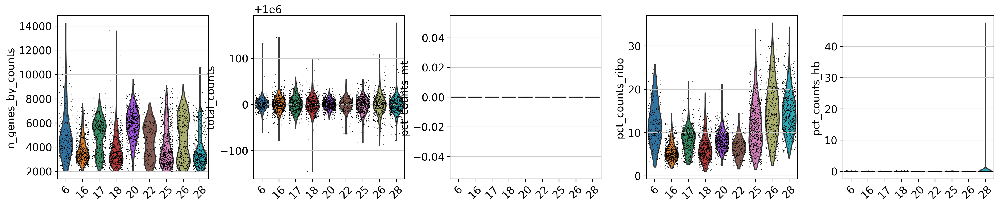

In [50]:
sc.pl.violin(final_adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo', 'pct_counts_hb'],
             jitter=0.4, groupby='batch', rotation= 45)

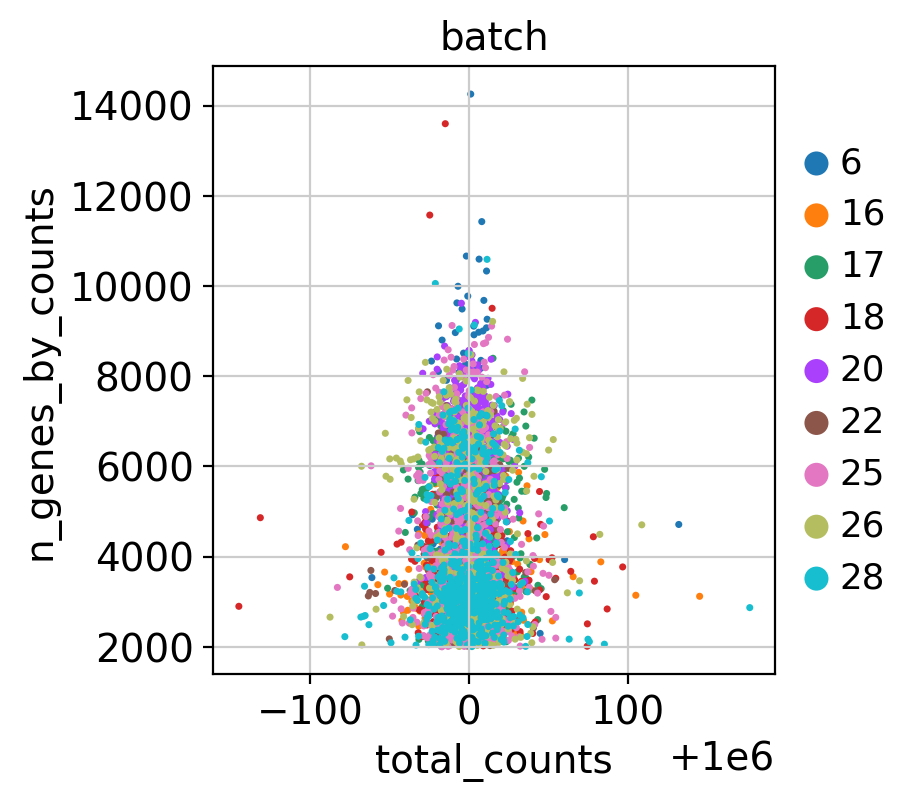

In [51]:
# expect to see an increasing number of detected genes with increasing total count
sc.pl.scatter(final_adata, x='total_counts', y='n_genes_by_counts', color="batch")

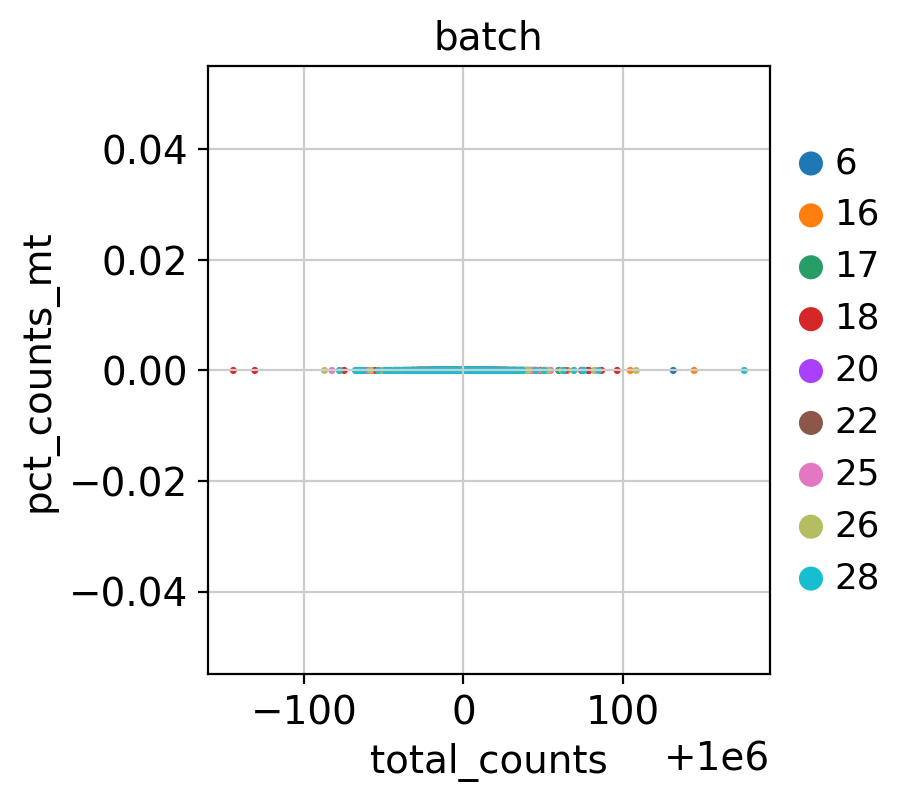

In [52]:
''' 
the total count for each cell against the mitochondrial/ribosomal content. 
Well-behaved cells should have a large number of expressed features and and a low percentage of expression from feature controls. 
High percentage expression from feature controls and few expressed features are indicative of blank and failed cells.
'''
sc.pl.scatter(final_adata, x='total_counts', y='pct_counts_mt', color="batch")

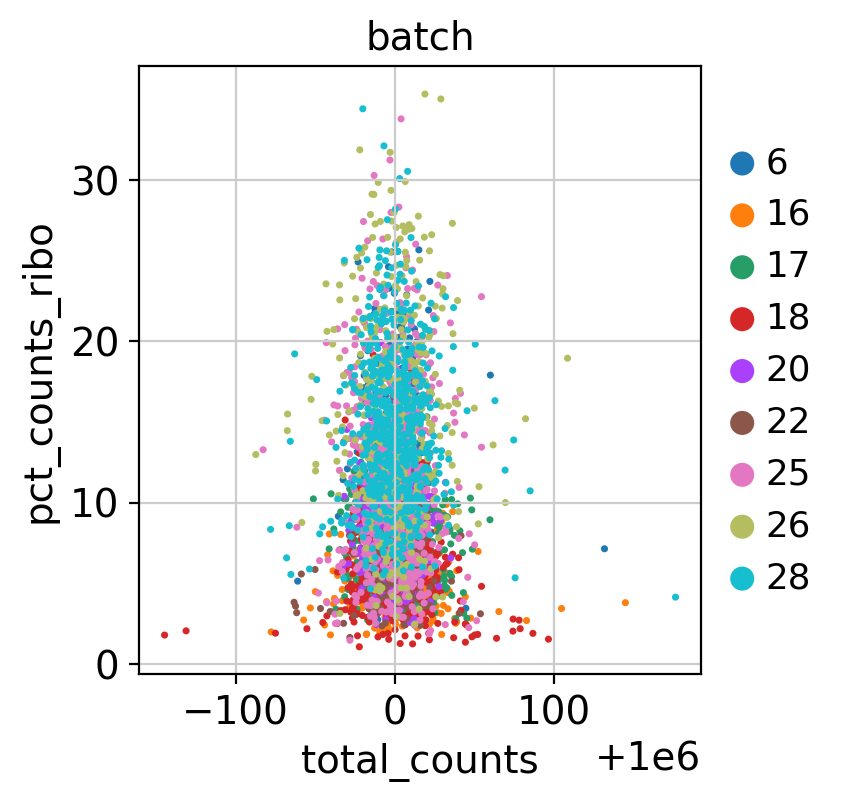

In [53]:
sc.pl.scatter(final_adata, x='total_counts', y='pct_counts_ribo', color="batch")

normalizing counts per cell
    finished (0:00:00)


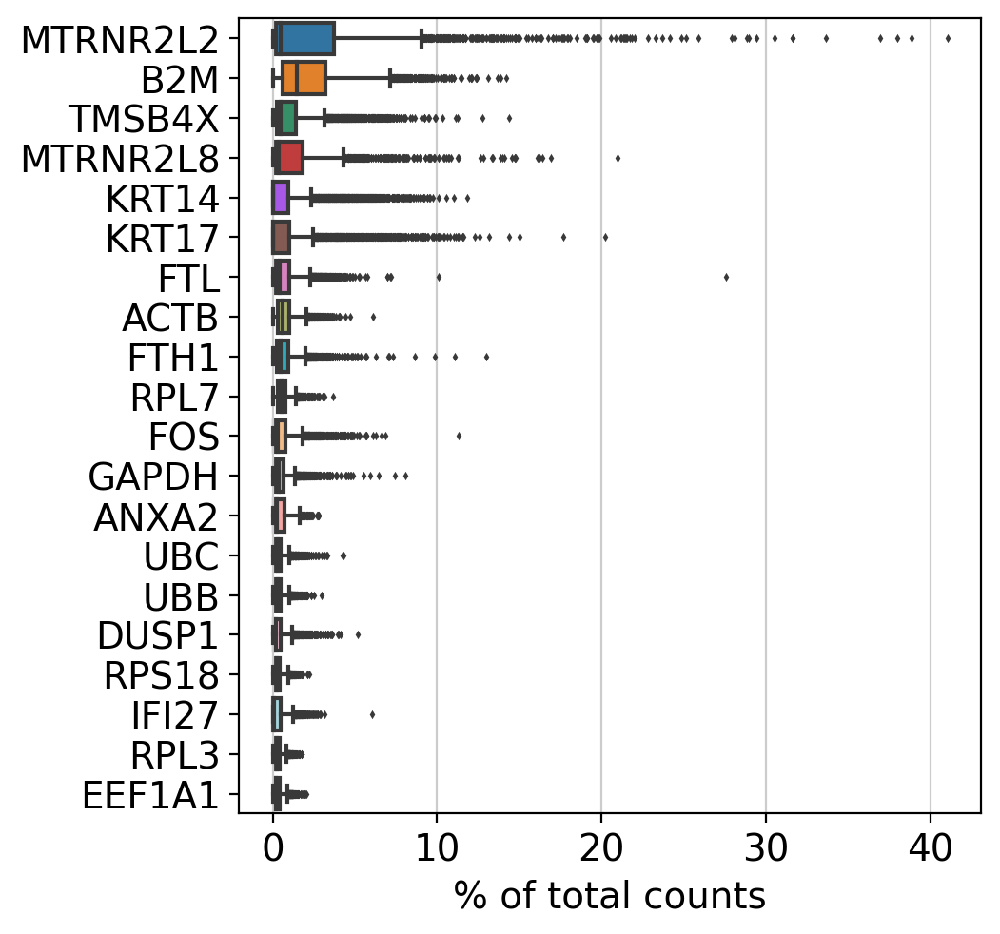

filtered out 2479 genes that are detected in less than 3 cells
cells:  4622 ,genes:  21207


'\nIt is quite common that nuclear lincRNAs have correlation with quality and mitochondrial reads, \nso high detection of MALAT1 may be a technical issue\n'

In [54]:
# Filtering
# begin preprocessing with genes that yield the highest fraction of counts in each single cell, across all cells.
sc.pl.highest_expr_genes(final_adata, n_top=20)
sc.pp.filter_cells(final_adata, min_genes=200)
sc.pp.filter_genes(final_adata, min_cells=3)
print("cells: ",final_adata.n_obs,",genes: ",final_adata.n_vars)

# We expect to see the “usual suspects”, i.e., mitochondrial genes, actin, ribosomal protein, MALAT1. A few spike-in transcripts may also be present here, 
# though if all of the spike-ins are in the top 50, it suggests that too much spike-in RNA was added. A large number of pseudo-genes or predicted genes may indicate problems with alignment. – Davis McCarthy and Aaron Lun
'''
It is quite common that nuclear lincRNAs have correlation with quality and mitochondrial reads, 
so high detection of MALAT1 may be a technical issue
'''

In [55]:
# filter cells for percent mito/ribo
# remove cells with high prop of mito and low prop of ribo reads

final_adata = final_adata[final_adata.obs['pct_counts_mt'] < 20, :]

# filter for percent ribo > 0.05
final_adata = final_adata[final_adata.obs['pct_counts_ribo'] > 3, :]

print("Remaining cells %d"%final_adata.n_obs)

Remaining cells 4487


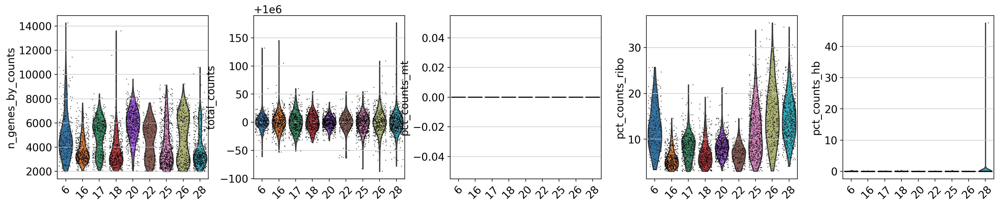

In [56]:
# filtered QC plots
sc.pl.violin(final_adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo', 'pct_counts_hb'],
             jitter=0.4, groupby='batch', rotation = 45)

In [57]:
# filter genes
# As the level of expression of mitochondrial and MALAT1 genes are judged as mainly technical, 
# it can be wise to remove them from the dataset bofore any further analysis.
malat1 = final_adata.var_names.str.startswith('MALAT1')

# we need to redefine the mito_genes since they were first 
# calculated on the full object before removing low expressed genes.
mito_genes = final_adata.var_names.str.startswith('MT-') 
hb_genes = final_adata.var_names.str.contains('^HB[^(P)]') 
remove = np.add(mito_genes, malat1)
remove = np.add(remove, hb_genes)
keep = np.invert(remove)

final_adata = final_adata[:,keep]

print("remain cells x genes:",final_adata.n_obs, final_adata.n_vars)

remain cells x genes: 4487 21196


In [58]:
final_adata

View of AnnData object with n_obs × n_vars = 4487 × 21196
    obs: 'Cell_type', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'n_genes'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'batch_colors'

In [109]:
# sex sampling skipped

In [59]:
# save normalized counts in raw slot.
final_adata.raw = final_adata

# normalize to depth 10 000
sc.pp.normalize_per_cell(final_adata, counts_per_cell_after=1e4)

# logaritmize
sc.pp.log1p(final_adata)

normalizing by total count per cell
    finished (0:00:01): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.17
Detected doublet rate = 0.1%
Estimated detectable doublet fraction = 43.5%
Overall doublet rate:
	Expected   = 1.0%
	Estimated  = 0.2%
Elapsed time: 8.9 seconds


3

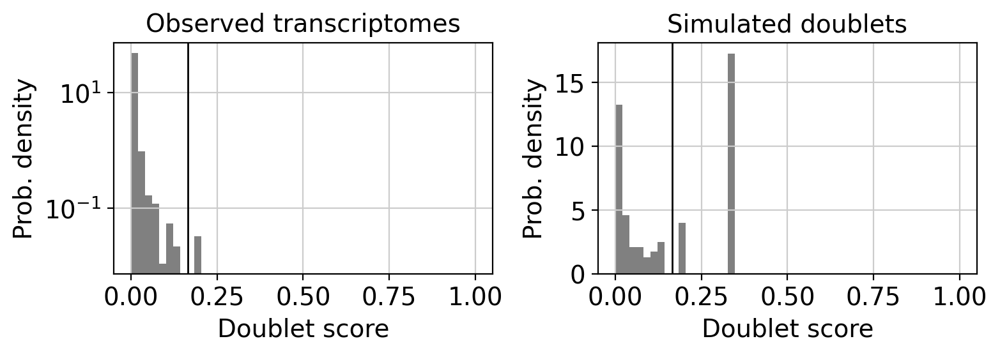

In [60]:
# Predict doublets
'''
Doublets/Mulitples of cells in the same well/droplet is a common issue in scRNAseq protocols. Especially in droplet-based methods whith overloading of cells. 
In a typical 10x experiment the proportion of doublets is linearly dependent on the amount of loaded cells. 
Most doublet detectors simulates doublets by merging cell counts and predicts doublets as cells that have similar embeddings as the simulated doublets.
Most such packages need an assumption about the number/proportion of expected doublets in the dataset.
Data Cillo has an average 2k cells loaded among all samples, so it should have a doublet rate at ~1%
'''
import scrublet as scr
scrub = scr.Scrublet(final_adata.raw.X,expected_doublet_rate=0.01)
final_adata.obs['doublet_scores'], final_adata.obs['predicted_doublets'] = scrub.scrub_doublets()
scrub.plot_histogram()

sum(final_adata.obs['predicted_doublets'])

In [61]:
'''
The simulated doublet histogram is typically bimodal. 
The left mode corresponds to "embedded" doublets generated by two cells with similar gene expression. 
The right mode corresponds to "neotypic" doublets, which are generated by cells with distinct gene expression (e.g., different cell types) 
and are expected to introduce more artifacts in downstream analyses. Scrublet can only detect neotypic doublets.
'''
# add in column with singlet/doublet instead of True/False
final_adata.obs['doublet_info'] = final_adata.obs["predicted_doublets"].astype(str)

In [62]:
# 3 doublets identified.
final_adata.obs[final_adata.obs['predicted_doublets']==True]

,Cell_type,batch,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt2,n_counts,n_genes,doublet_scores,predicted_doublets,doublet_info
HNSCC20_P15_LN_A10_S202_comb,tumor,20,3574,1.000020e+06,0.0,0.0,96659.195312,9.665726,0.000000,0.000000,0.0,9.977189e+05,3574,0.2,True,True
HNSCC20_P5_pri_B02_S14_comb,tumor,20,6446,9.999989e+05,0.0,0.0,74696.671875,7.469675,7.229968,0.000723,0.0,9.992886e+05,6446,0.2,True,True
HNSCC6_p16_HNSCC6_P16_C01,tumor,6,3534,1.000016e+06,0.0,0.0,123441.914062,12.343998,0.000000,0.000000,0.0,1.000008e+06,3534,0.2,True,True


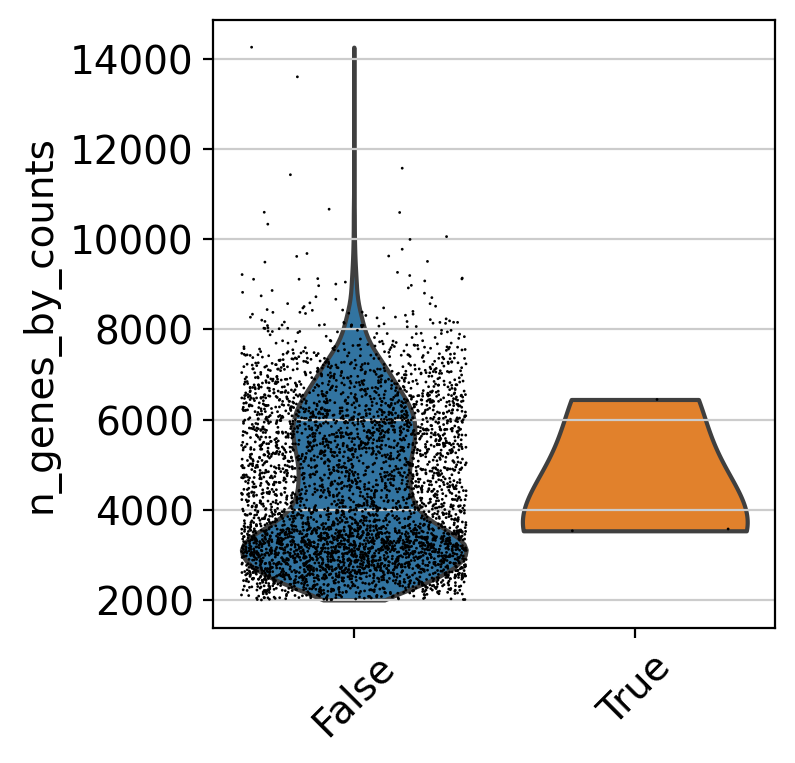

In [63]:
# We should expect that two cells have more detected genes than a single cell, 
# lets check if our predicted doublets also have more detected genes in general.
sc.pl.violin(final_adata, 'n_genes_by_counts', 
             # equivalent metric in seurat is 'nFeature_RNA'
             jitter=0.4, groupby = 'doublet_info', rotation=45)

In [64]:
# Now, lets run PCA and UMAP and plot doublet scores onto umap to check the doublet predictions.
sc.pp.highly_variable_genes(final_adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
final_adata = final_adata[:, final_adata.var.highly_variable]

sc.pp.regress_out(final_adata, ['total_counts', 'pct_counts_mt'])

sc.pp.scale(final_adata, max_value=10)
sc.tl.pca(final_adata, svd_solver='arpack')
sc.pp.neighbors(final_adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(final_adata)

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
regressing out ['total_counts', 'pct_counts_mt']
    finished (0:00:48)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)


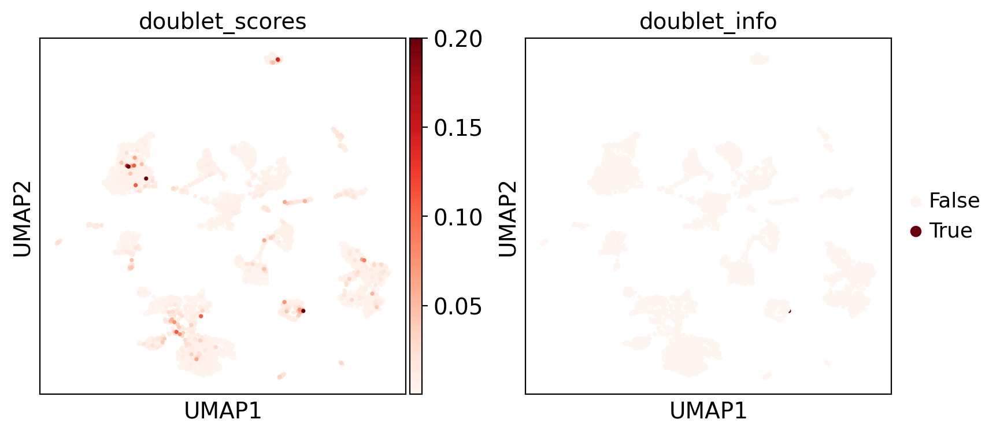

In [65]:
# very little amount of doublets are found, hardly recognizable from plots
sc.pl.umap(final_adata, color=['doublet_scores','doublet_info'],color_map='Reds',palette='Reds')

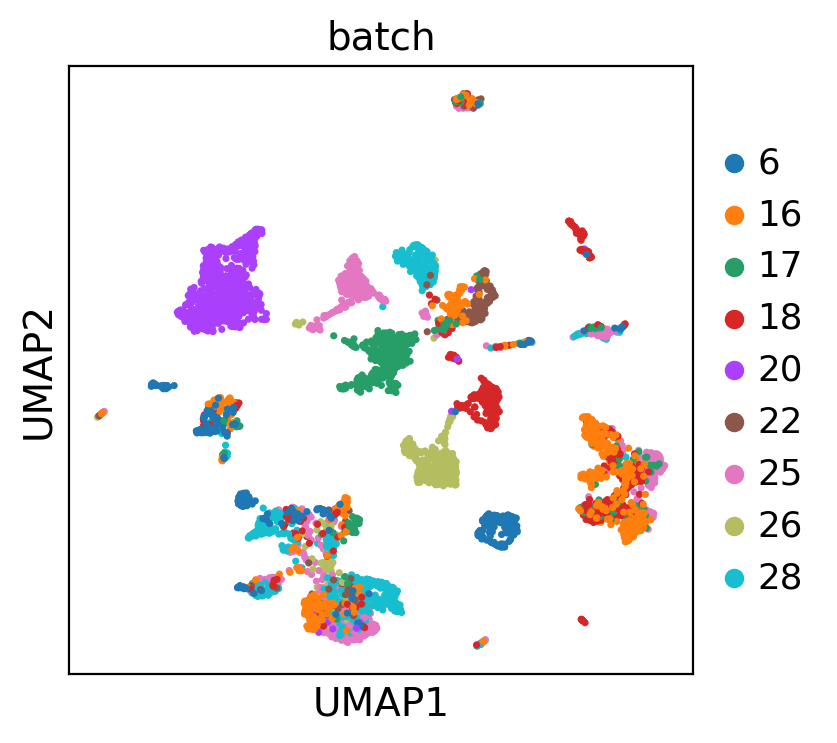

In [69]:
sc.pl.umap(final_adata, color=['batch'],save='_filtered_umap.png')

In [67]:
# remove all doublets predicted from data
# also revert back to the raw counts as the main matrix in adata
final_adata = final_adata.raw.to_adata() 

final_adata = final_adata[final_adata.obs['doublet_info'] == 'False',:]
print(final_adata.shape)

(4484, 21196)


In [195]:
# just in case use wrong column in metadata as batch info
def fix_batch(final_adata,df_tmp_Puram = df_tmp_Puram):
    final_adata.obs['batch'] = df_tmp_Puram[df_tmp_Puram['cell'].isin(final_adata.obs.index)]['patient'].apply(str).tolist()
    return final_adata

In [197]:
# final_adata = fix_batch(final_adata)

In [70]:
results_file = './Puram/Puram_scanpy.h5ad'  # the file that will store the analysis results
final_adata.write(results_file)

In [71]:
final_adata = sc.read_h5ad(results_file)
final_adata.uns['log1p']["base"] = None
final_adata

AnnData object with n_obs × n_vars = 4484 × 21196
    obs: 'Cell_type', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'n_genes', 'doublet_scores', 'predicted_doublets', 'doublet_info'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'batch_colors', 'doublet_info_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

### 2.Dim Reduction

In [73]:
# Before variable gene selection we need to normalize and logaritmize the data. 
# Then store the full matrix in the raw slot before doing variable gene selection.
# normalize to depth 10 000
Puram_adata = final_adata.copy()
# To make sure result retractable, cillo_adata will be our subject from here on
sc.pp.normalize_per_cell(Puram_adata, counts_per_cell_after=1e4)

# logaritmize
sc.pp.log1p(Puram_adata)

# store normalized counts in the raw slot, 
# we will subset final_adata.X for variable genes, but want to keep all genes matrix as well.
Puram_adata.raw = Puram_adata

Puram_adata

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


AnnData object with n_obs × n_vars = 4484 × 21196
    obs: 'Cell_type', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'n_genes', 'doublet_scores', 'predicted_doublets', 'doublet_info'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'batch_colors', 'doublet_info_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
Highly variable genes: 5009


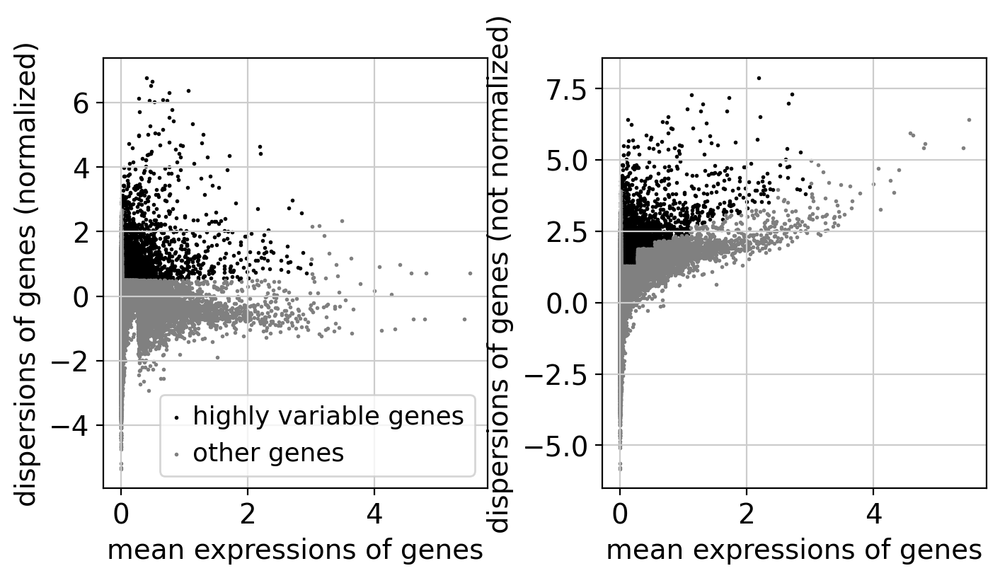

In [74]:
# Next, we first need to define which features/genes are important in our dataset to distinguish cell types. 
# For this purpose, we need to find genes that are highly variable across cells, which in turn will also provide a good separation of the cell clusters.
# compute variable genes
sc.pp.highly_variable_genes(Puram_adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
print("Highly variable genes: %d"%sum(Puram_adata.var.highly_variable))

#plot variable genes
sc.pl.highly_variable_genes(Puram_adata)

# subset for variable genes in the dataset
Puram_adata = Puram_adata[:, Puram_adata.var['highly_variable']]

Now that the data is prepared, we now proceed with PCA. Since each gene has a different expression level, it means that genes with higher expression values will naturally have higher variation that will be captured by PCA. This means that we need to somehow give each gene a similar weight when performing PCA (see below). The common practice is to center and scale each gene before performing PCA. This exact scaling is called Z-score normalization it is very useful for PCA, clustering and plotting heatmaps.

Additionally, we can use regression to remove any unwanted sources of variation from the dataset, such as cell cycle, sequencing depth, percent mitocondria. This is achieved by doing a generalized linear regression using these parameters as covariates in the model. Then the residuals of the model are taken as the "regressed data". Although perhaps not in the best way, batch effect regression can also be done here.

In [75]:
# regress out unwanted variables
sc.pp.regress_out(Puram_adata, ['total_counts', 'pct_counts_mt'])

# scale data, clip values exceeding standard deviation 10.
sc.pp.scale(Puram_adata, max_value=10)

regressing out ['total_counts', 'pct_counts_mt']
    finished (0:00:48)


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)


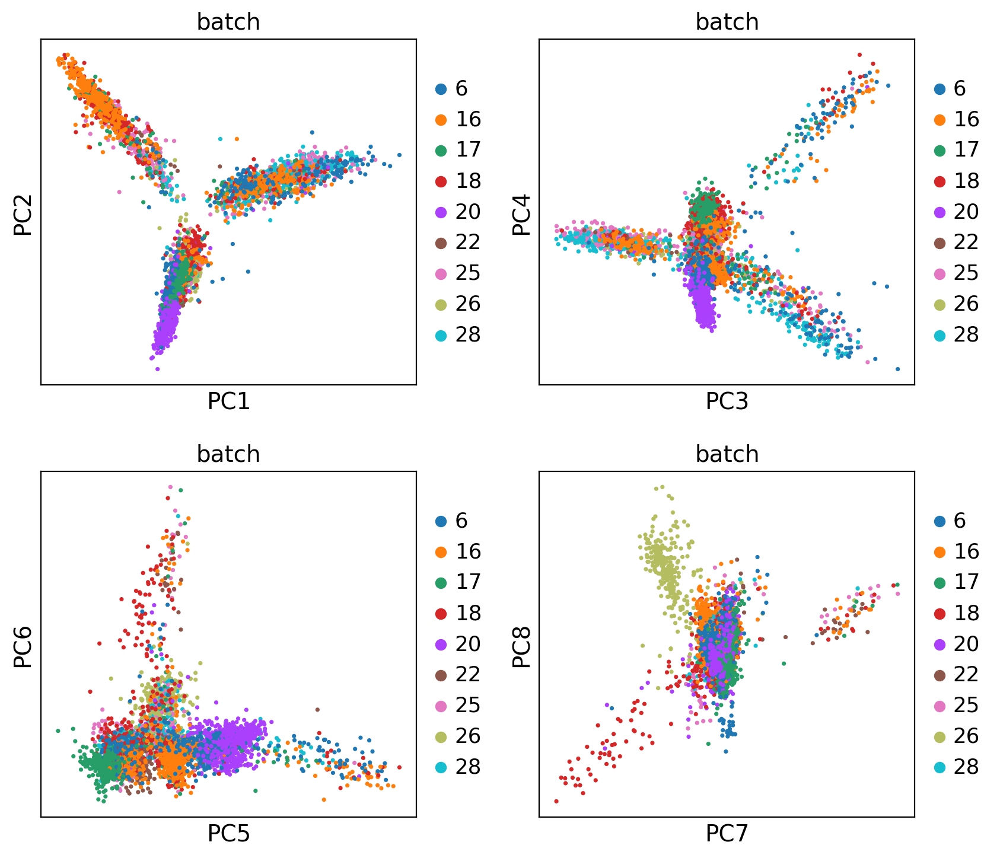

In [80]:
# PCA
# Performing PCA has many useful applications and interpretations, 
# which much depends on the data used. In the case of life sciences, 
# we want to segregate samples based on gene expression patterns in the data.
sc.tl.pca(Puram_adata, svd_solver='arpack')

# plot more PCS
sc.pl.pca(Puram_adata, color='batch', components = ['1,2','3,4','5,6','7,8'], ncols=2)

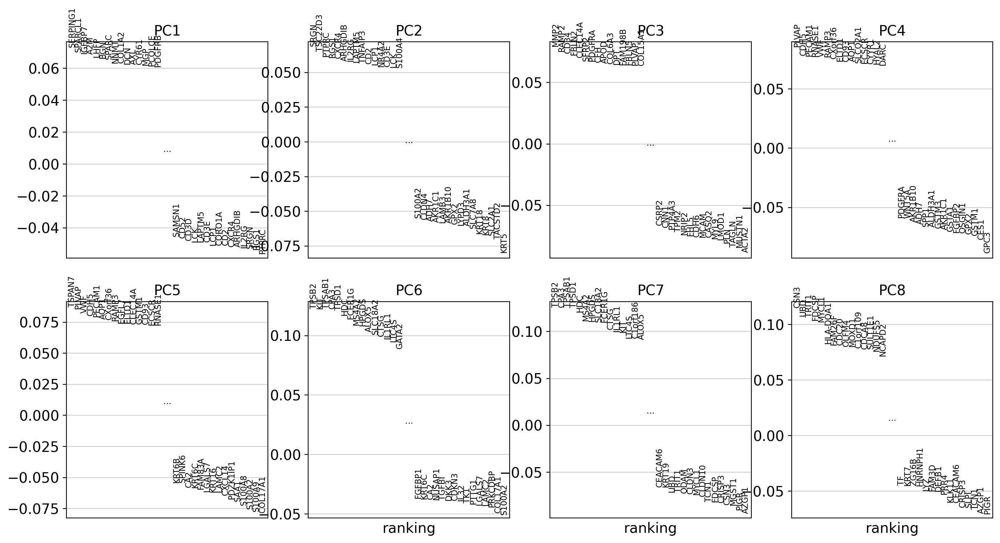

In [77]:
#Plot loadings
sc.pl.pca_loadings(Puram_adata, components=[1,2,3,4,5,6,7,8])

# OBS! only plots the positive axes genes from each PC!!

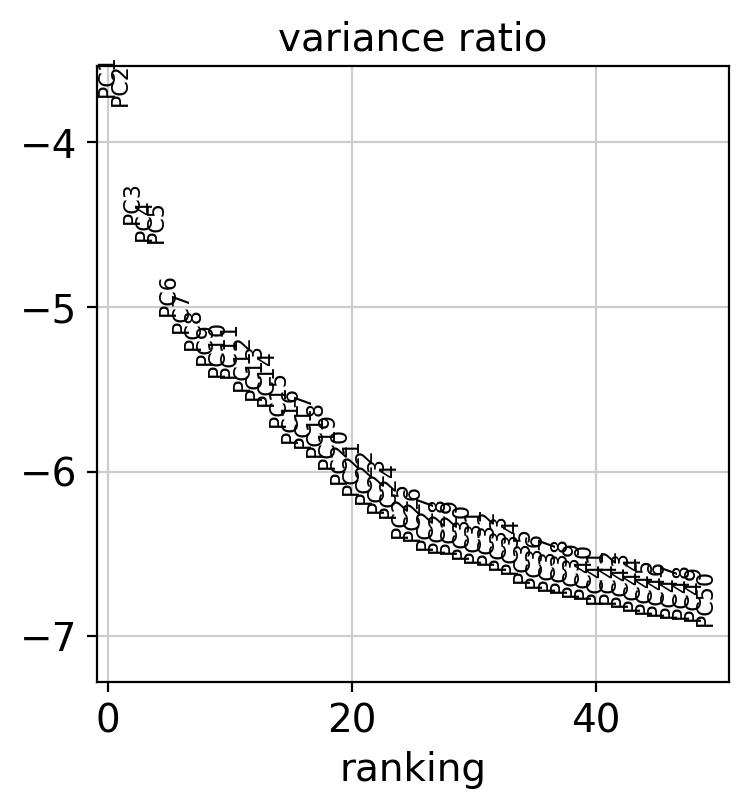

In [78]:
sc.pl.pca_variance_ratio(Puram_adata, log=True, n_pcs = 50)

In [81]:
# regular BH T-SNE plot
sc.tl.tsne(Puram_adata, n_pcs = 30)

computing tSNE
    using 'X_pca' with n_pcs = 30
    using sklearn.manifold.TSNE


/home/cke/miniconda3/envs/BLADE/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:08)


In [13]:
Puram_adata.obs

,Cell_type,batch,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt2,n_counts,n_genes,doublet_scores,predicted_doublets,doublet_info
HN28_P15_D06_S330_comb,Fibroblast,28,4286,1.000009e+06,0.0,0.0,86613.296875,8.661255,76.009735,0.007601,0.0,998772.7500,4286,0.001839,False,False
HN28_P6_G05_S173_comb,Fibroblast,28,2723,1.000014e+06,0.0,0.0,149693.578125,14.969142,0.000000,0.000000,0.0,998379.7500,2723,0.001245,False,False
HN26_P14_D11_S239_comb,tumor,26,6965,9.999924e+05,0.0,0.0,186097.953125,18.609936,48.559368,0.004856,0.0,999708.2500,6965,0.000950,False,False
HN26_P14_H05_S281_comb,Fibroblast,26,3451,1.000007e+06,0.0,0.0,132006.796875,13.200584,1.369982,0.000137,0.0,998924.0000,3451,0.004927,False,False
HN26_P25_H09_S189_comb,tumor,26,7355,1.000015e+06,0.0,0.0,187427.015625,18.742414,40.318760,0.004032,0.0,999479.3750,7355,0.000880,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HNSCC17_P4_G12_S180_comb,other,17,4801,1.000001e+06,0.0,0.0,88164.929688,8.816483,0.000000,0.000000,0.0,996694.6875,4801,0.006500,False,False
HNSCC20_P13_C05_S221_comb,tumor,20,5788,1.000003e+06,0.0,0.0,125418.648438,12.541826,0.000000,0.000000,0.0,997012.5000,5788,0.003883,False,False
HNSCC17_P4_C12_S132_comb,tumor,17,5375,9.999812e+05,0.0,0.0,113774.828125,11.377696,40.110050,0.004011,0.0,999734.4375,5375,0.002911,False,False
HNSCC20_P3_H08_S92_comb,tumor,20,5666,1.000019e+06,0.0,0.0,86069.804688,8.606817,0.000000,0.000000,0.0,998648.0625,5666,0.001572,False,False


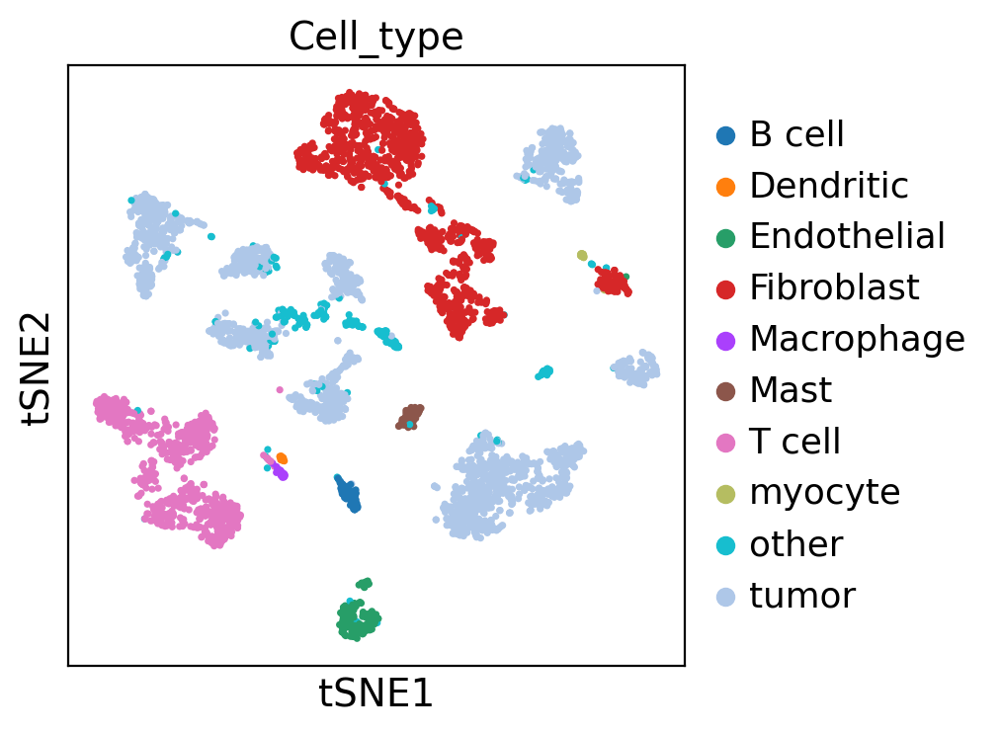

In [14]:
sc.pl.tsne(Puram_adata, color='Cell_type',save='Cell_type_filtered_dr_tsne.png')

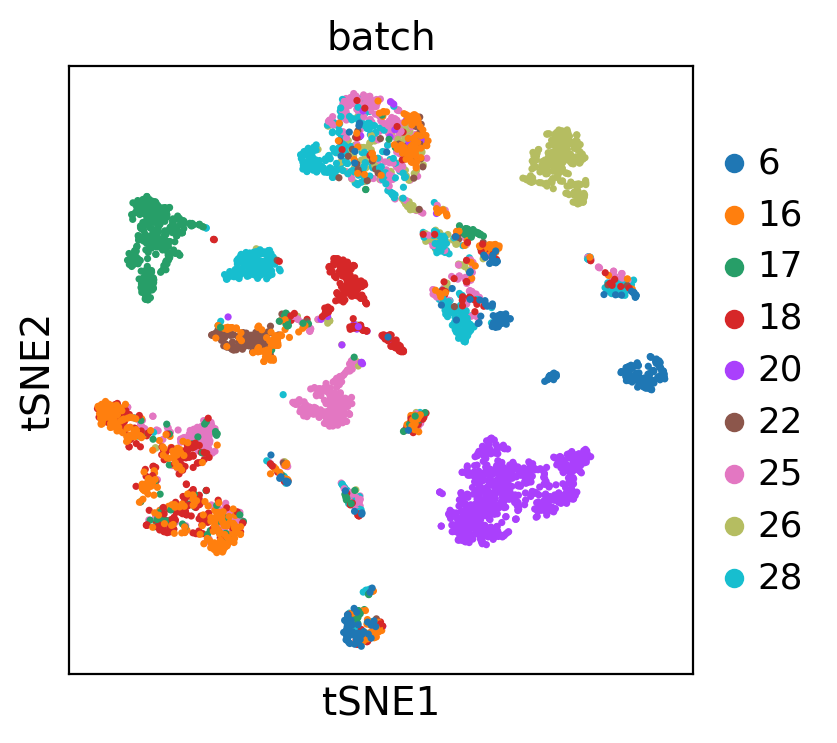

In [89]:
sc.pl.tsne(Puram_adata, color='batch',save='_filtered_dr_tsne.png')
# We can clearly see the effect of batches present in the dataset.

In [83]:
sc.pp.neighbors(Puram_adata, n_pcs = 30, n_neighbors = 20)

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [84]:
sc.tl.umap(Puram_adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


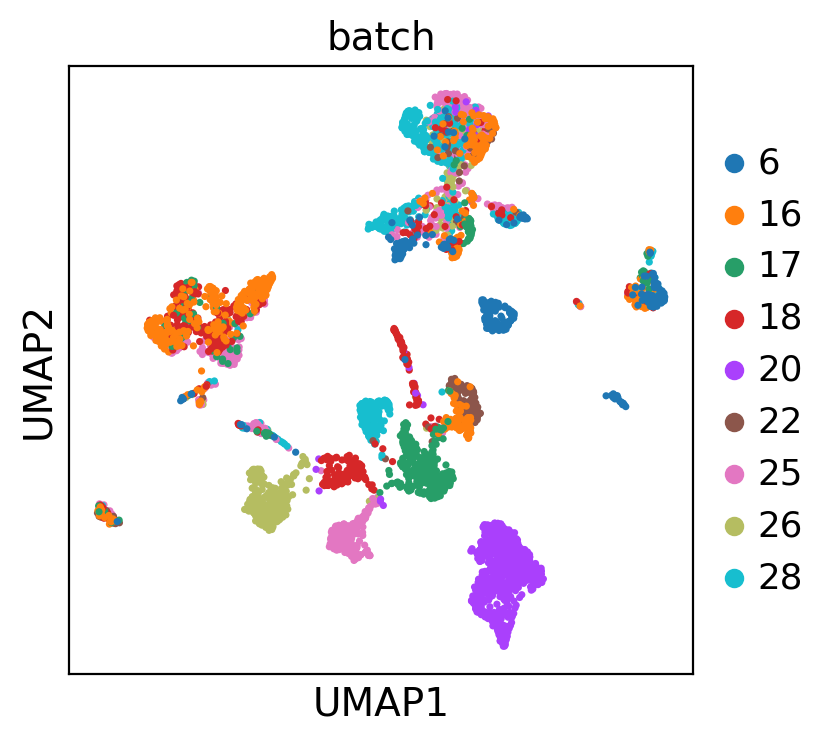

In [90]:
sc.pl.umap(Puram_adata, color='batch',save='_filtered_dr_umap.png')

In [86]:
print(Puram_adata.X.shape)
print(Puram_adata.raw.X.shape) # counts are after dr not raw!

(4484, 5009)
(4484, 21196)


In [87]:
Puram_adata

AnnData object with n_obs × n_vars = 4484 × 5009
    obs: 'Cell_type', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'n_genes', 'doublet_scores', 'predicted_doublets', 'doublet_info'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'doublet_info_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'umap', 'tsne'
    obsm: 'X_pca', 'X_umap', 'X_tsne'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [199]:
# Puram_adata = fix_batch(Puram_adata)

In [88]:
save_file = './Puram/scanpy_qc_dr_Puram.h5ad'
Puram_adata.write_h5ad(save_file)

In [7]:
Puram_adata = sc.read_h5ad('./Puram/scanpy_qc_dr_Puram.h5ad')
Puram_adata.uns['log1p']["base"] = None
Puram_adata

AnnData object with n_obs × n_vars = 4484 × 5009
    obs: 'Cell_type', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'n_genes', 'doublet_scores', 'predicted_doublets', 'doublet_info'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'doublet_info_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'tsne', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

### Data integration
As the stored AnnData object contains scaled data based on variable genes, we need to make a new object with the logtransformed normalized counts. The new variable gene selection should not be performed on the scaled data matrix.

In [138]:
adata2 = Puram_adata.raw.to_adata() 

# check that the matrix looks like noramlized counts
print(adata2.X[1:10,1:10])

[[2.8148472  0.         0.         1.5967407  0.         0.
  0.04943941 0.         0.        ]
 [2.8056648  0.         0.         0.47814476 0.         0.749653
  0.00945784 0.         0.        ]
 [0.         1.54761    0.         1.8389676  0.         1.4106108
  0.6286777  0.         0.        ]
 [2.9280047  0.04106649 0.         0.01450218 0.028019   0.
  0.01173698 0.         0.        ]
 [2.588272   0.         0.         0.2613072  0.         0.
  0.0073734  0.         0.        ]
 [1.9819853  0.         0.         0.         0.         0.
  0.09569686 0.         0.        ]
 [2.2766688  0.6770467  0.         0.2967593  0.         0.07945448
  0.6435254  0.         0.        ]
 [2.337699   0.         0.         0.74077487 0.         0.
  0.00608391 0.         0.        ]
 [3.243371   0.2543324  0.         0.         0.         1.0592488
  0.05613184 0.         0.        ]]


In [139]:
var_genes_all = Puram_adata.var.highly_variable

print("Highly variable genes: %d"%sum(var_genes_all))

Highly variable genes: 5166


In [140]:
# Detect variable genes in each dataset separately using the batch_key parameter.

sc.pp.highly_variable_genes(adata2, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key = 'batch')

print("Highly variable genes intersection: %d"%sum(adata2.var.highly_variable_intersection))

print("Number of batches where gene is variable:")
print(adata2.var.highly_variable_nbatches.value_counts())

var_genes_batch = adata2.var.highly_variable_nbatches > 0

extracting highly variable genes


/home/cke/miniconda3/envs/BLADE/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/cke/miniconda3/envs/BLADE/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/cke/miniconda3/envs/BLADE/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/cke/miniconda3/envs/BLADE/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:4

    finished (0:00:07)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
Highly variable genes intersection: 2
Number of batches where gene is variable:
0     4399
1     2551
2     1760
3     1437
4     1245
5     1219
6     1073
7     1038
8     1013
9      931
10     882
11     842
12     754
13     699
14     573
15     417
16     305
17     180
18      98
19      19
20       2
Name: highly_variable_nbatches, dtype: int64


/home/cke/miniconda3/envs/BLADE/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)


In [141]:
print("Any batch var genes: %d"%sum(var_genes_batch))
print("All data var genes: %d"%sum(var_genes_all))
print("Overlap: %d"%sum(var_genes_batch & var_genes_all))
print("Variable genes in all batches: %d"%sum(adata2.var.highly_variable_nbatches == 6))
print("Overlap batch instersection and all: %d"%sum(var_genes_all & adata2.var.highly_variable_intersection))

Any batch var genes: 17038
All data var genes: 5166
Overlap: 5164
Variable genes in all batches: 1073
Overlap batch instersection and all: 2


In [142]:
# Select all genes that are variable in at least 2 datasets and use for remaining analysis.
var_select = adata2.var.highly_variable_nbatches > 2
var_genes = var_select.index[var_select]
len(var_genes)

12727

In [143]:
# Data integration
# split per batch into new objects.
batches = Puram_adata.obs['batch'].cat.categories.tolist()
alldata = {}
for batch in batches:
    alldata[batch] = adata2[adata2.obs['batch'] == batch,]
alldata   

{'HN23': View of AnnData object with n_obs × n_vars = 51 × 21437
     obs: 'Cell_type', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'n_genes', 'doublet_scores', 'predicted_doublets', 'doublet_info'
     var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
     uns: 'batch_colors', 'log1p', 'doublet_info_colors', 'hvg', 'pca', 'neighbors', 'umap', 'tsne'
     obsm: 'X_pca', 'X_umap', 'X_tsne'
     obsp: 'distances', 'connectivities',
 'HN25': View of AnnData object with n_obs × n_vars = 223 × 21437
     obs: 'Cell_type', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb'

### Harmony

In [146]:
# for harmony, we don't actually need alldata and adata2 we just created, that was for other potential methods
# create a new object with lognormalized counts
adata_harmony = Puram_adata.copy()

# first store the raw data 
adata_harmony.raw = adata_harmony

# run harmony
sc.external.pp.harmony_integrate(adata_harmony, key='batch')

2022-06-24 13:15:52,813 - harmonypy - INFO - Iteration 1 of 10
2022-06-24 13:15:55,686 - harmonypy - INFO - Iteration 2 of 10
2022-06-24 13:15:58,545 - harmonypy - INFO - Iteration 3 of 10
2022-06-24 13:16:01,444 - harmonypy - INFO - Iteration 4 of 10
2022-06-24 13:16:03,881 - harmonypy - INFO - Iteration 5 of 10
2022-06-24 13:16:06,441 - harmonypy - INFO - Converged after 5 iterations


In [147]:
# tsne and umap
sc.pp.neighbors(adata_harmony, n_pcs =50, use_rep = "X_pca_harmony")
sc.tl.umap(adata_harmony)
sc.tl.tsne(adata_harmony, n_pcs = 50, use_rep = "X_pca_harmony")

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)
computing tSNE
    using sklearn.manifold.TSNE


/home/cke/miniconda3/envs/BLADE/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:08)


<AxesSubplot:title={'center':'Uncorrected umap'}, xlabel='UMAP1', ylabel='UMAP2'>

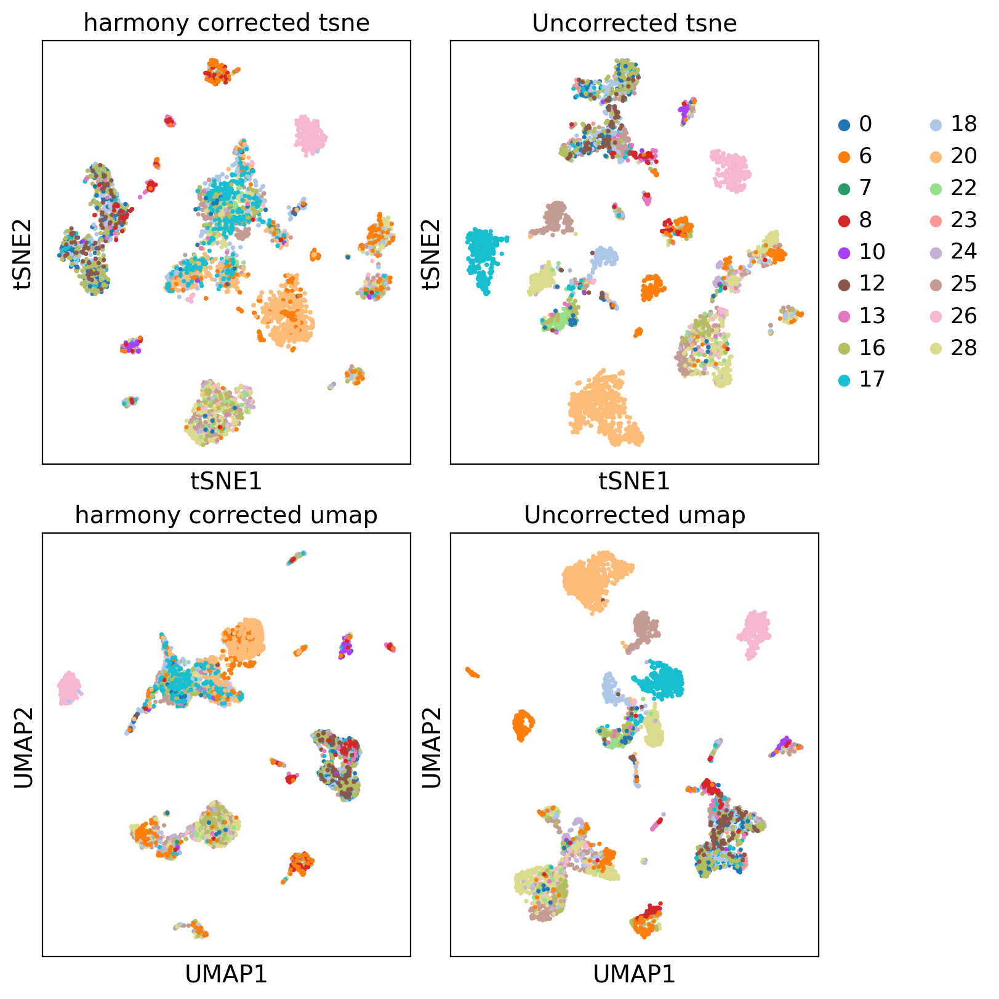

In [204]:
fig, axs = plt.subplots(2, 2, figsize=(8,8),constrained_layout=True)
sc.pl.tsne(adata_harmony, color="batch", title="harmony corrected tsne", ax=axs[0,0], show=False,legend_loc=None)
sc.pl.tsne(Puram_adata, color="batch", title="Uncorrected tsne", ax=axs[0,1], show=False,)
sc.pl.umap(adata_harmony, color="batch", title="harmony corrected umap", ax=axs[1,0], show=False,legend_loc=None)
sc.pl.umap(Puram_adata, color="batch", title="Uncorrected umap", ax=axs[1,1], show=False,legend_loc=None)

<AxesSubplot:title={'center':'Uncorrected umap'}, xlabel='UMAP1', ylabel='UMAP2'>

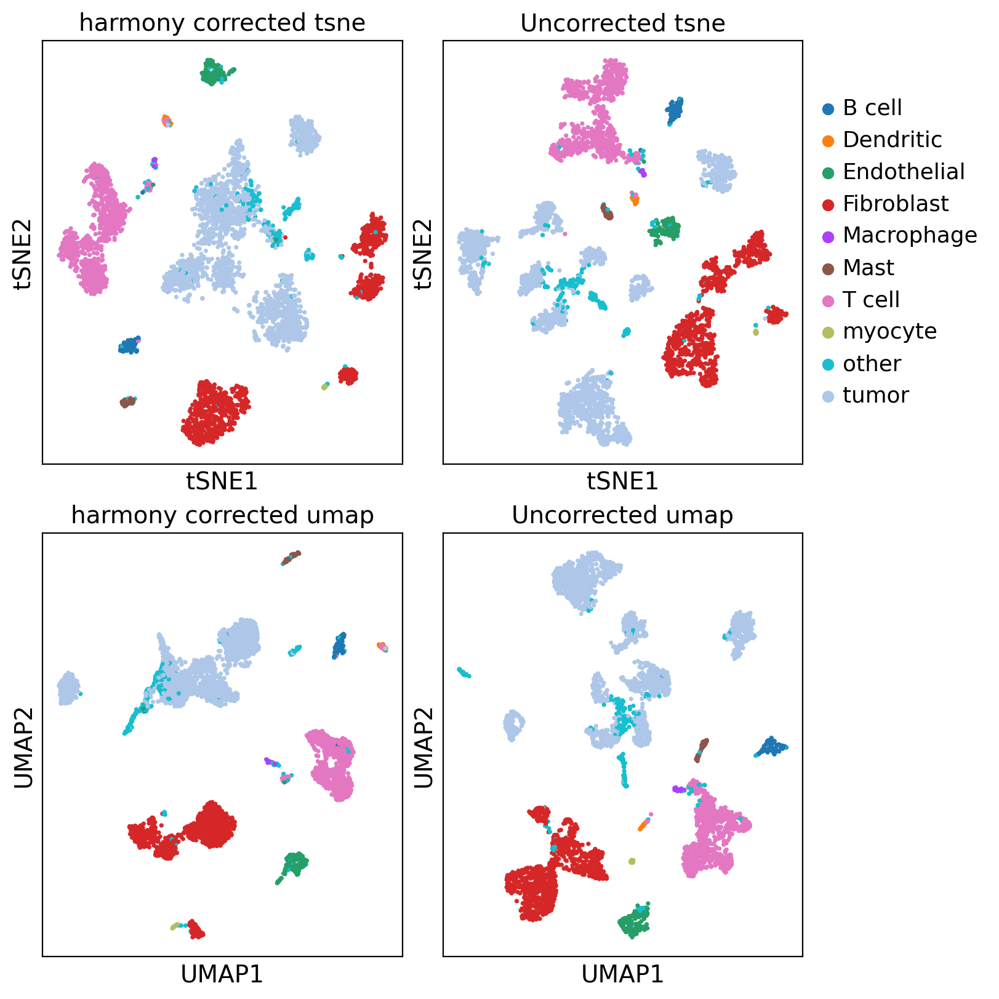

In [205]:
fig, axs = plt.subplots(2, 2, figsize=(8,8),constrained_layout=True)
sc.pl.tsne(adata_harmony, color="Cell_type", title="harmony corrected tsne", ax=axs[0,0], show=False,legend_loc=None)
sc.pl.tsne(Puram_adata, color="Cell_type", title="Uncorrected tsne", ax=axs[0,1], show=False,)
sc.pl.umap(adata_harmony, color="Cell_type", title="harmony corrected umap", ax=axs[1,0], show=False,legend_loc=None)
sc.pl.umap(Puram_adata, color="Cell_type", title="Uncorrected umap", ax=axs[1,1], show=False,legend_loc=None)

In [189]:
adata_harmony
#after preprocessing and be removel, left with 4460 cells x 5166 genes

AnnData object with n_obs × n_vars = 4460 × 5166
    obs: 'Cell_type', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'n_genes', 'doublet_scores', 'predicted_doublets', 'doublet_info'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'log1p', 'doublet_info_colors', 'hvg', 'pca', 'neighbors', 'umap', 'tsne', 'Cell_type_colors'
    obsm: 'X_pca', 'X_umap', 'X_tsne', 'X_pca_harmony'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [202]:
adata_harmony = fix_batch(adata_harmony)

In [203]:
#save to file
save_file_harmony = './Puram/scanpy_harmony_corrected_Puram.h5ad'
adata_harmony.write_h5ad(save_file_harmony)

In [ ]:
adata_harmony = sc.read_h5ad(save_file_harmony)
# adata_harmony.uns['log1p']["base"] = None
adata_harmony

## Pseudo bulk prepare
Use QC filtered raw counts final_adata n_obs × n_vars = 4484 × 21196
- Subsetting to the cells for the cell type(s) of interest 
- Extracting the raw counts after QC filtering to be used for the DE analysis
- Aggregating the counts and metadata to the sample level.
- Performing the DE analysis (Need at least two biological replicates per condition to perform the analysis, but more replicates are recommended).


In [22]:
final_adata

AnnData object with n_obs × n_vars = 4484 × 21196
    obs: 'Cell_type', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'n_genes', 'doublet_scores', 'predicted_doublets', 'doublet_info'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'batch_colors', 'doublet_info_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [20]:
final_adata_mean = final_adata.copy()
# normalize to depth 10^6, simulate TPM
# sc.pp.normalize_per_cell(final_adata_mean, counts_per_cell_after=1e6)
# logaritmize
sc.pp.log1p(final_adata_mean)

In [21]:
final_adata_mean.to_df().sum(axis=1)

HN28_P15_D06_S330_comb       14614.943359
HN28_P6_G05_S173_comb        10539.978516
HN26_P14_D11_S239_comb       21638.980469
HN26_P14_H05_S281_comb       11302.610352
HN26_P25_H09_S189_comb       19727.142578
                                 ...     
HNSCC17_P4_G12_S180_comb     15452.511719
HNSCC20_P13_C05_S221_comb    20227.621094
HNSCC17_P4_C12_S132_comb     20523.613281
HNSCC20_P3_H08_S92_comb      19723.734375
HNSCC20_P3_G06_S78_comb      20979.882812
Length: 4484, dtype: float32

In [24]:
final_adata_mean.to_df()

,C9orf152,RPS11,ELMO2,CREB3L1,PNMA1,MMP2,TMEM216,TRAF3IP2-AS1,LRRC37A5P,LOC653712,...,MIR4691,GPLD1,RAB8A,RXFP2,PCIF1,PIK3IP1,SNRPD2,SLC39A6,CTSC,AQP7
HN28_P15_D06_S330_comb,0.000000,6.449907,0.000000,0.0,5.844769,0.000000,0.000000,1.196946,0.0,0.000000,...,0.0,0.647099,0.824185,0.0,5.058143,0.000000,0.000000,0.000000,0.364645,0.0
HN28_P6_G05_S173_comb,0.000000,7.357250,0.000000,0.0,5.976487,0.000000,0.000000,1.801707,0.0,0.000000,...,0.0,0.000000,0.000000,0.0,6.632749,0.000000,5.800080,0.000000,1.150563,0.0
HN26_P14_D11_S239_comb,1.492912,7.348815,0.000000,0.0,4.131801,0.000000,4.723788,0.667826,0.0,0.000000,...,0.0,0.000000,2.309554,0.0,5.083042,4.280937,6.325714,0.000000,4.810052,0.0
HN26_P14_H05_S281_comb,0.000000,0.000000,5.915189,0.0,6.271810,0.000000,5.738224,4.482084,0.0,0.000000,...,0.0,0.285178,6.125702,0.0,0.000000,6.639903,0.000000,0.000000,0.806469,0.0
HN26_P25_H09_S189_comb,0.000000,7.478231,1.646725,0.0,0.900171,1.345483,0.000000,0.779324,0.0,0.000000,...,0.0,0.398778,1.226704,0.0,5.532675,4.889077,5.327540,0.000000,4.581153,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HNSCC17_P4_G12_S180_comb,0.000000,5.995342,0.000000,0.0,0.000000,5.419894,0.000000,0.000000,0.0,0.000000,...,0.0,0.350655,5.151128,0.0,0.000000,3.602523,6.116443,0.000000,6.212002,0.0
HNSCC20_P13_C05_S221_comb,0.000000,7.446112,0.000000,0.0,0.000000,0.000000,5.640371,0.000000,0.0,2.280343,...,0.0,1.047328,0.000000,0.0,0.000000,0.000000,4.995159,0.000000,2.309554,0.0
HNSCC17_P4_C12_S132_comb,0.000000,7.038549,4.483688,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,...,0.0,3.703988,4.603466,0.0,3.762112,0.000000,6.600902,5.369680,5.600003,0.0
HNSCC20_P3_H08_S92_comb,0.000000,7.055106,0.000000,0.0,5.985916,0.000000,5.350029,1.280925,0.0,0.000000,...,0.0,0.625931,0.000000,0.0,5.068033,2.902554,6.347896,0.000000,0.609746,0.0


### prepare signature matrix for BLADE for TCGA scRNA ref

In [117]:
#prepare signature matrix for BLADE
merge_celltype = pd.merge(final_adata_mean.to_df(),final_adata.obs,left_index=True,right_index=True)
counts_Puram_mean = merge_celltype.groupby(['Cell_type']).aggregate(np.mean).fillna(0)[final_adata_mean.to_df().columns]
counts_Puram_mean

,C9orf152,RPS11,ELMO2,CREB3L1,PNMA1,MMP2,TMEM216,TRAF3IP2-AS1,LRRC37A5P,LOC653712,...,MIR4691,GPLD1,RAB8A,RXFP2,PCIF1,PIK3IP1,SNRPD2,SLC39A6,CTSC,AQP7
Cell_type,,,,,,,,,,,,,,,,,,,,,
B cell,0.000000,6.492917,0.231680,0.000000,0.453225,0.079074,0.158905,1.160454,0.000000,0.147792,...,0.000000,0.513217,2.475292,0.000000,1.002625,0.157418,2.199768,0.382470,1.737483,0.000000
Dendritic,0.129314,5.855553,1.369407,0.000000,1.837884,0.000000,0.000000,1.017574,0.000000,0.170419,...,0.000000,0.334965,2.506136,0.000000,0.666744,0.000000,2.046748,0.488054,3.486444,0.000000
Endothelial,0.052885,6.375462,0.738443,0.026067,1.065678,3.012341,0.436707,1.169286,0.000000,0.198585,...,0.054856,0.564138,2.298328,0.000000,1.739616,1.018390,3.646981,0.343366,2.743636,0.038372
Fibroblast,0.005461,5.998231,0.812115,0.176889,1.151217,2.414215,0.433489,1.118312,0.000000,0.168878,...,0.000000,0.491453,1.409226,0.002075,1.393451,0.796913,2.856363,0.892032,1.961192,0.057252
Macrophage,0.000000,6.124608,0.723999,0.000000,0.230229,0.600399,0.756342,0.858826,0.000000,0.331381,...,0.000000,0.604568,3.824592,0.000000,1.944457,1.598965,5.250042,0.843303,4.411457,0.000000
Mast,0.000000,4.881329,0.965855,0.000000,0.482366,0.111721,0.476207,1.405295,0.000000,0.256124,...,0.000000,0.654584,1.565061,0.000000,1.095256,2.003856,2.220285,0.437975,2.088800,0.041966
T cell,0.002805,4.473081,0.536432,0.001527,0.410232,0.009048,0.330094,1.324624,0.000000,0.180352,...,0.013776,0.944539,1.657100,0.006724,0.993673,3.261685,2.216675,0.426652,2.629155,0.000000
myocyte,0.000000,5.786865,0.548613,0.000000,0.538573,0.000000,0.649324,0.914729,0.000000,0.242955,...,0.000000,0.508312,0.846572,0.000000,1.290272,0.253657,3.812994,0.387895,1.266796,0.225407
other,0.180350,6.249870,0.670335,0.437221,0.432366,0.593619,0.507095,1.236821,0.006755,0.251775,...,0.017066,0.918532,1.949008,0.000000,1.282030,0.941179,3.847157,1.241713,2.373988,0.062681


In [118]:
#prepare signature matrix for BLADE
# merge_celltype = pd.merge(final_adata.to_df(),final_adata.obs,left_index=True,right_index=True)
counts_Puram_std = merge_celltype.groupby(['Cell_type']).aggregate(np.std).fillna(0)[final_adata_mean.to_df().columns]
counts_Puram_std

,C9orf152,RPS11,ELMO2,CREB3L1,PNMA1,MMP2,TMEM216,TRAF3IP2-AS1,LRRC37A5P,LOC653712,...,MIR4691,GPLD1,RAB8A,RXFP2,PCIF1,PIK3IP1,SNRPD2,SLC39A6,CTSC,AQP7
Cell_type,,,,,,,,,,,,,,,,,,,,,
B cell,0.000000,1.569083,1.024816,0.000000,1.600212,0.359478,0.941068,1.139211,0.000000,0.643086,...,0.000000,0.605285,2.798313,0.000000,1.959734,0.861253,2.801245,1.332978,1.675631,0.000000
Dendritic,0.533175,2.415082,2.537175,0.000000,2.714607,0.000000,0.000000,0.614453,0.000000,0.487597,...,0.000000,0.311250,2.912664,0.000000,1.882232,0.000000,2.883952,1.451410,2.526854,0.000000
Endothelial,0.447254,1.626582,1.803345,0.323487,2.176253,2.991018,1.525520,1.423118,0.000000,0.654305,...,0.481949,0.639545,2.671255,0.000000,2.537445,2.210117,2.962255,1.232040,2.250254,0.280259
Fibroblast,0.131000,2.139246,1.901123,0.839489,2.299641,3.276111,1.491563,1.275400,0.000000,0.635519,...,0.000000,0.671915,2.377714,0.070188,2.371771,2.002890,2.985022,1.958433,1.837194,0.522816
Macrophage,0.000000,2.089465,1.696161,0.000000,1.079868,1.546273,1.722435,0.709722,0.000000,0.752499,...,0.000000,0.665212,2.361322,0.000000,2.155384,2.647975,1.885839,1.713031,2.763014,0.000000
Mast,0.000000,2.893029,2.138883,0.000000,1.673030,0.722294,1.597333,1.431263,0.000000,0.706774,...,0.000000,0.528308,2.606581,0.000000,2.286608,3.020602,2.992708,1.412418,1.985712,0.335731
T cell,0.049732,3.215680,1.759074,0.041143,1.538503,0.088290,1.439609,0.927486,0.000000,0.633594,...,0.262294,0.656816,2.769509,0.139538,2.228189,3.505046,3.161581,1.520799,2.418915,0.000000
myocyte,0.000000,2.600562,1.643300,0.000000,1.506835,0.000000,1.946302,1.093925,0.000000,0.731140,...,0.000000,0.740730,2.015091,0.000000,2.222094,0.838905,2.502764,1.288368,1.388323,0.982525
other,0.895201,2.453489,1.709334,1.415810,1.425913,1.685736,1.569568,1.232215,0.106378,0.701632,...,0.268758,1.181390,2.547101,0.000000,2.302695,2.093334,3.087212,2.108297,2.037376,0.516832


In [99]:
# save sc ref for BLADE in pseudo bulk analysis
counts_Puram_mean.T.to_csv("/home/cke/Puram/HNSCC2PuramGSE103322_qc_mean.tsv",sep='\t')
counts_Puram_std.T.to_csv("/home/cke/Puram/HNSCC2PuramGSE103322_qc_std.tsv",sep='\t')

### signature matrix for BLADE, for pseudobulk analysis

In [114]:
merge_celltype_pseudobulk = merge_celltype[merge_celltype['batch'].isin(train_set)]
merge_celltype_pseudobulk

,C9orf152,RPS11,ELMO2,CREB3L1,PNMA1,MMP2,TMEM216,TRAF3IP2-AS1,LRRC37A5P,LOC653712,...,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt2,n_counts,n_genes,doublet_scores,predicted_doublets,doublet_info
HN28_P15_D06_S330_comb,0.0,6.449907,0.000000,0.0,5.844769,0.0,0.000000,1.196946,0.0,0.000000,...,86613.296875,8.661255,76.009735,0.007601,0.0,998772.7500,4286,0.001839,False,False
HN28_P6_G05_S173_comb,0.0,7.357250,0.000000,0.0,5.976487,0.0,0.000000,1.801707,0.0,0.000000,...,149693.578125,14.969142,0.000000,0.000000,0.0,998379.7500,2723,0.001245,False,False
HN25_P25_C04_S316_comb,0.0,6.429235,0.000000,0.0,0.000000,0.0,0.000000,2.391509,0.0,0.000000,...,116469.343750,11.646800,0.000000,0.000000,0.0,988791.0000,3991,0.003301,False,False
HN25_P5_E10_S58_comb,0.0,6.500154,0.000000,0.0,5.351185,0.0,5.373363,1.074991,0.0,0.000000,...,79200.187500,7.920081,190.105881,0.019011,0.0,997869.3125,5064,0.006002,False,False
HN25_P24_B02_S110_comb,0.0,7.512226,4.088287,0.0,3.195012,0.0,3.166727,0.000000,0.0,0.000000,...,207293.625000,20.729551,14.840210,0.001484,0.0,999624.8750,7755,0.001572,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HNSCC20_P3_C08_S32_comb,0.0,5.614896,0.000000,0.0,0.000000,0.0,0.000000,3.449701,0.0,0.000000,...,50826.878906,5.082690,28.190134,0.002819,0.0,999018.4375,6897,0.001404,False,False
HNSCC20_P3_F09_S69_comb,0.0,7.374189,0.000000,0.0,0.000000,0.0,4.665197,0.000000,0.0,0.000000,...,145400.203125,14.540458,84.159065,0.008416,0.0,999494.4375,6848,0.001169,False,False
HNSCC20_P13_C05_S221_comb,0.0,7.446112,0.000000,0.0,0.000000,0.0,5.640371,0.000000,0.0,2.280343,...,125418.648438,12.541826,0.000000,0.000000,0.0,997012.5000,5788,0.003883,False,False
HNSCC20_P3_H08_S92_comb,0.0,7.055106,0.000000,0.0,5.985916,0.0,5.350029,1.280925,0.0,0.000000,...,86069.804688,8.606817,0.000000,0.000000,0.0,998648.0625,5666,0.001572,False,False


In [116]:
counts_Puram_mean_pseudo = merge_celltype_pseudobulk.groupby(['Cell_type']).aggregate(np.mean).fillna(0)[final_adata_mean.to_df().columns]
counts_Puram_mean_pseudo

,C9orf152,RPS11,ELMO2,CREB3L1,PNMA1,MMP2,TMEM216,TRAF3IP2-AS1,LRRC37A5P,LOC653712,...,MIR4691,GPLD1,RAB8A,RXFP2,PCIF1,PIK3IP1,SNRPD2,SLC39A6,CTSC,AQP7
Cell_type,,,,,,,,,,,,,,,,,,,,,
B cell,0.000000,6.536193,0.278801,0.000000,0.447420,0.095157,0.191225,1.183971,0.000000,0.177852,...,0.000000,0.539967,2.258438,0.000000,1.098606,0.189435,2.137657,0.460260,1.730577,0.000000
Dendritic,0.169103,5.617897,0.767950,0.000000,2.360781,0.000000,0.000000,0.888723,0.000000,0.222856,...,0.000000,0.380739,2.787867,0.000000,0.871896,0.000000,2.156563,0.418450,3.558525,0.000000
Endothelial,0.070575,6.196889,0.767212,0.047790,1.173896,3.752138,0.549274,1.220676,0.000000,0.260985,...,0.100569,0.658060,2.391202,0.000000,2.121010,0.970802,3.918479,0.265447,2.382459,0.015955
Fibroblast,0.007456,6.088026,0.844069,0.123011,1.186037,2.323277,0.388832,1.111119,0.000000,0.194957,...,0.000000,0.492855,1.362258,0.002833,1.470931,0.782512,2.855643,0.897780,1.842629,0.066295
Macrophage,0.000000,5.665292,0.514319,0.000000,0.460457,0.533721,1.288154,0.913690,0.000000,0.662761,...,0.000000,0.793539,3.179077,0.000000,2.096047,1.632635,4.760371,1.174580,4.133679,0.000000
Mast,0.000000,5.271932,0.977274,0.000000,0.812406,0.188162,0.531313,1.350885,0.000000,0.370423,...,0.000000,0.628978,1.522102,0.000000,1.274193,1.328141,2.431556,0.591965,1.961476,0.000000
T cell,0.003085,4.475267,0.579148,0.001680,0.401283,0.009953,0.347178,1.310230,0.000000,0.170873,...,0.015154,0.919308,1.582239,0.007396,1.047529,3.177067,2.309299,0.437798,2.694183,0.000000
myocyte,0.000000,5.786865,0.548613,0.000000,0.538573,0.000000,0.649324,0.914729,0.000000,0.242955,...,0.000000,0.508312,0.846572,0.000000,1.290272,0.253657,3.812994,0.387895,1.266796,0.225407
other,0.235316,5.633049,0.702818,0.621996,0.495062,0.660289,0.522657,0.940281,0.000000,0.168034,...,0.024751,0.649792,2.175295,0.000000,1.364627,1.106345,4.206372,1.110097,2.323877,0.045576


In [119]:
#prepare signature matrix for BLADE
# merge_celltype = pd.merge(final_adata.to_df(),final_adata.obs,left_index=True,right_index=True)
counts_Puram_std_pseudo = merge_celltype_pseudobulk.groupby(['Cell_type']).aggregate(np.std).fillna(0)[final_adata_mean.to_df().columns]
counts_Puram_std_pseudo

,C9orf152,RPS11,ELMO2,CREB3L1,PNMA1,MMP2,TMEM216,TRAF3IP2-AS1,LRRC37A5P,LOC653712,...,MIR4691,GPLD1,RAB8A,RXFP2,PCIF1,PIK3IP1,SNRPD2,SLC39A6,CTSC,AQP7
Cell_type,,,,,,,,,,,,,,,,,,,,,
B cell,0.000000,1.590167,1.119901,0.000000,1.600638,0.392942,1.030802,1.201526,0.000000,0.702627,...,0.000000,0.591177,2.698569,0.000000,1.984610,0.942897,2.741925,1.451906,1.657771,0.000000
Dendritic,0.609709,2.664802,1.795341,0.000000,2.923594,0.000000,0.000000,0.630903,0.000000,0.551671,...,0.000000,0.327252,2.901088,0.000000,2.128369,0.000000,2.859801,1.508744,2.589593,0.000000
Endothelial,0.556533,1.538435,1.835369,0.438004,2.277855,3.035312,1.706106,1.353899,0.000000,0.798492,...,0.650782,0.663843,2.632468,0.000000,2.729284,2.139637,2.873863,1.097205,2.157668,0.146234
Fibroblast,0.153036,1.963525,1.932602,0.688737,2.311482,3.272683,1.424268,1.290681,0.000000,0.680175,...,0.000000,0.724282,2.331237,0.082008,2.418077,1.977391,2.974343,1.950901,1.750908,0.574847
Macrophage,0.000000,2.440630,1.270295,0.000000,1.527164,1.770153,2.247994,0.726122,0.000000,0.973420,...,0.000000,0.799835,2.512449,0.000000,2.141034,2.724714,2.496891,2.061752,3.160255,0.000000
Mast,0.000000,2.515159,2.092973,0.000000,2.119089,0.934635,1.709669,1.265352,0.000000,0.864108,...,0.000000,0.531820,2.452229,0.000000,2.442115,2.615165,3.096190,1.754341,1.772154,0.000000
T cell,0.052155,3.209744,1.824909,0.043151,1.523247,0.092557,1.480947,0.924909,0.000000,0.596003,...,0.275078,0.623354,2.704486,0.146341,2.273322,3.479556,3.195698,1.530394,2.440054,0.000000
myocyte,0.000000,2.600562,1.643300,0.000000,1.506835,0.000000,1.946302,1.093925,0.000000,0.731140,...,0.000000,0.740730,2.015091,0.000000,2.222094,0.838905,2.502764,1.288368,1.388323,0.982525
other,1.065370,2.466452,1.732194,1.666426,1.533543,1.788641,1.582432,1.072562,0.000000,0.633314,...,0.323660,0.754718,2.655257,0.000000,2.382708,2.293732,2.966383,1.961752,2.152217,0.432830


In [120]:
# save sc ref for BLADE in pseudo bulk analysis
counts_Puram_mean_pseudo.T.to_csv("/home/cke/Puram/HNSCC2PuramGSE103322_qc_mean_pseudotrain.tsv",sep='\t')
counts_Puram_std_pseudo.T.to_csv("/home/cke/Puram/HNSCC2PuramGSE103322_qc_std_pseudotrain.tsv",sep='\t')

In [136]:
final_adata.to_df()

,C9orf152,RPS11,ELMO2,CREB3L1,PNMA1,MMP2,TMEM216,TRAF3IP2-AS1,LRRC37A5P,LOC653712,...,MIR4691,GPLD1,RAB8A,RXFP2,PCIF1,PIK3IP1,SNRPD2,SLC39A6,CTSC,AQP7
HN28_P15_D06_S330_comb,0.000000,631.643494,0.000000,0.0,344.422913,0.000000,0.000000,2.309994,0.0,0.000000,...,0.0,0.909992,1.280023,0.0,156.298126,0.000000,0.000000,0.000000,0.440002,0.0
HN28_P6_G05_S173_comb,0.000000,1566.520386,0.000000,0.0,393.053650,0.000000,0.000000,5.059981,0.0,0.000000,...,0.0,0.000000,0.000000,0.0,758.567444,0.000000,329.325989,0.000000,2.159973,0.0
HN26_P14_D11_S239_comb,3.450036,1553.353271,0.000000,0.0,61.290012,0.000000,111.593987,0.949993,0.0,0.000000,...,0.0,0.000000,9.069936,0.0,160.263824,71.308151,557.756348,0.000000,121.738029,0.0
HN26_P14_H05_S281_comb,0.000000,0.000000,369.624176,0.0,528.434875,0.000000,309.512390,87.418785,0.0,0.000000,...,0.0,0.329998,456.466003,0.0,0.000000,764.020569,0.000000,0.000000,1.239984,0.0
HN26_P25_H09_S189_comb,0.000000,1768.109009,4.189955,0.0,1.460024,2.840043,0.000000,1.179999,0.0,0.000000,...,0.0,0.490002,2.409973,0.0,251.819382,131.830902,204.930756,0.000000,96.626930,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HNSCC17_P4_G12_S180_comb,0.000000,400.553986,0.000000,0.0,0.000000,224.855255,0.000000,0.000000,0.0,0.000000,...,0.0,0.419998,171.626144,0.0,0.000000,35.690681,452.249542,0.000000,497.698456,0.0
HNSCC20_P13_C05_S221_comb,0.000000,1712.189453,0.000000,0.0,0.000000,0.000000,280.567200,0.000000,0.0,8.780038,...,0.0,1.850024,0.000000,0.0,0.000000,0.000000,146.696381,0.000000,9.069936,0.0
HNSCC17_P4_C12_S132_comb,0.000000,1138.733276,87.560692,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,...,0.0,39.608936,98.829666,0.0,42.039246,0.000000,734.758118,213.794083,269.427094,0.0
HNSCC20_P3_H08_S92_comb,0.000000,1157.760010,0.000000,0.0,396.786530,0.000000,209.614288,2.599967,0.0,0.000000,...,0.0,0.869985,0.000000,0.0,157.861557,17.220621,570.289124,0.000000,0.839964,0.0


In [10]:
merge_sample = pd.merge(final_adata.to_df(),final_adata.obs,left_index=True,right_index=True)
merge_sample

,C9orf152,RPS11,ELMO2,CREB3L1,PNMA1,MMP2,TMEM216,TRAF3IP2-AS1,LRRC37A5P,LOC653712,...,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt2,n_counts,n_genes,doublet_scores,predicted_doublets,doublet_info
HN28_P15_D06_S330_comb,0.000000,631.643494,0.000000,0.0,344.422913,0.000000,0.000000,2.309994,0.0,0.000000,...,86613.296875,8.661255,76.009735,0.007601,0.0,998772.7500,4286,0.001839,False,False
HN28_P6_G05_S173_comb,0.000000,1566.520386,0.000000,0.0,393.053650,0.000000,0.000000,5.059981,0.0,0.000000,...,149693.578125,14.969142,0.000000,0.000000,0.0,998379.7500,2723,0.001245,False,False
HN26_P14_D11_S239_comb,3.450036,1553.353271,0.000000,0.0,61.290012,0.000000,111.593987,0.949993,0.0,0.000000,...,186097.953125,18.609936,48.559368,0.004856,0.0,999708.2500,6965,0.000950,False,False
HN26_P14_H05_S281_comb,0.000000,0.000000,369.624176,0.0,528.434875,0.000000,309.512390,87.418785,0.0,0.000000,...,132006.796875,13.200584,1.369982,0.000137,0.0,998924.0000,3451,0.004927,False,False
HN26_P25_H09_S189_comb,0.000000,1768.109009,4.189955,0.0,1.460024,2.840043,0.000000,1.179999,0.0,0.000000,...,187427.015625,18.742414,40.318760,0.004032,0.0,999479.3750,7355,0.000880,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HNSCC17_P4_G12_S180_comb,0.000000,400.553986,0.000000,0.0,0.000000,224.855255,0.000000,0.000000,0.0,0.000000,...,88164.929688,8.816483,0.000000,0.000000,0.0,996694.6875,4801,0.006500,False,False
HNSCC20_P13_C05_S221_comb,0.000000,1712.189453,0.000000,0.0,0.000000,0.000000,280.567200,0.000000,0.0,8.780038,...,125418.648438,12.541826,0.000000,0.000000,0.0,997012.5000,5788,0.003883,False,False
HNSCC17_P4_C12_S132_comb,0.000000,1138.733276,87.560692,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,...,113774.828125,11.377696,40.110050,0.004011,0.0,999734.4375,5375,0.002911,False,False
HNSCC20_P3_H08_S92_comb,0.000000,1157.760010,0.000000,0.0,396.786530,0.000000,209.614288,2.599967,0.0,0.000000,...,86069.804688,8.606817,0.000000,0.000000,0.0,998648.0625,5666,0.001572,False,False


In [140]:
merge_sample_pseudobulk = merge_sample[merge_sample['batch'].isin(train_set)]
merge_sample_pseudobulk

,C9orf152,RPS11,ELMO2,CREB3L1,PNMA1,MMP2,TMEM216,TRAF3IP2-AS1,LRRC37A5P,LOC653712,...,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt2,n_counts,n_genes,doublet_scores,predicted_doublets,doublet_info
HN28_P15_D06_S330_comb,0.0,631.643494,0.000000,0.0,344.422913,0.0,0.000000,2.309994,0.0,0.000000,...,86613.296875,8.661255,76.009735,0.007601,0.0,998772.7500,4286,0.001839,False,False
HN28_P6_G05_S173_comb,0.0,1566.520386,0.000000,0.0,393.053650,0.0,0.000000,5.059981,0.0,0.000000,...,149693.578125,14.969142,0.000000,0.000000,0.0,998379.7500,2723,0.001245,False,False
HN25_P25_C04_S316_comb,0.0,618.700073,0.000000,0.0,0.000000,0.0,0.000000,9.929976,0.0,0.000000,...,116469.343750,11.646800,0.000000,0.000000,0.0,988791.0000,3991,0.003301,False,False
HN25_P5_E10_S58_comb,0.0,664.244507,0.000000,0.0,209.857986,0.0,214.586609,1.929967,0.0,0.000000,...,79200.187500,7.920081,190.105881,0.019011,0.0,997869.3125,5064,0.006002,False,False
HN25_P24_B02_S110_comb,0.0,1829.283447,58.637642,0.0,23.410463,0.0,22.729691,0.000000,0.0,0.000000,...,207293.625000,20.729551,14.840210,0.001484,0.0,999624.8750,7755,0.001572,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HNSCC20_P3_C08_S32_comb,0.0,273.484894,0.000000,0.0,0.000000,0.0,0.000000,30.490965,0.0,0.000000,...,50826.878906,5.082690,28.190134,0.002819,0.0,999018.4375,6897,0.001404,False,False
HNSCC20_P3_F09_S69_comb,0.0,1593.299316,0.000000,0.0,0.000000,0.0,105.186523,0.000000,0.0,0.000000,...,145400.203125,14.540458,84.159065,0.008416,0.0,999494.4375,6848,0.001169,False,False
HNSCC20_P13_C05_S221_comb,0.0,1712.189453,0.000000,0.0,0.000000,0.0,280.567200,0.000000,0.0,8.780038,...,125418.648438,12.541826,0.000000,0.000000,0.0,997012.5000,5788,0.003883,False,False
HNSCC20_P3_H08_S92_comb,0.0,1157.760010,0.000000,0.0,396.786530,0.0,209.614288,2.599967,0.0,0.000000,...,86069.804688,8.606817,0.000000,0.000000,0.0,998648.0625,5666,0.001572,False,False


In [141]:
# save sc ref for pseudobulk analysis
merge_sample_pseudobulk.iloc[:,:21196].to_csv("/home/cke/Puram/Puram_pseudobulk_scRNAtrain.tsv",sep='\t')
# save sc ref for TCGA analysis!
final_adata.to_df().to_csv("/home/cke/Puram/Puram_pseudobulk_scRNAref.tsv",sep='\t')

In [143]:
merge_sample_test = merge_sample[merge_sample['batch'].isin(test_set)]
merge_sample_test

,C9orf152,RPS11,ELMO2,CREB3L1,PNMA1,MMP2,TMEM216,TRAF3IP2-AS1,LRRC37A5P,LOC653712,...,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt2,n_counts,n_genes,doublet_scores,predicted_doublets,doublet_info
HN26_P14_D11_S239_comb,3.450036,1553.353271,0.000000,0.0,61.290012,0.000000,111.593987,0.949993,0.0,0.0,...,186097.953125,18.609936,48.559368,0.004856,0.0,999708.2500,6965,0.000950,False,False
HN26_P14_H05_S281_comb,0.000000,0.000000,369.624176,0.0,528.434875,0.000000,309.512390,87.418785,0.0,0.0,...,132006.796875,13.200584,1.369982,0.000137,0.0,998924.0000,3451,0.004927,False,False
HN26_P25_H09_S189_comb,0.000000,1768.109009,4.189955,0.0,1.460024,2.840043,0.000000,1.179999,0.0,0.0,...,187427.015625,18.742414,40.318760,0.004032,0.0,999479.3750,7355,0.000880,False,False
HN26_P14_H06_S282_comb,0.000000,1230.518921,0.000000,0.0,29.858847,0.000000,0.000000,0.739970,0.0,0.0,...,205467.640625,20.547018,0.000000,0.000000,0.0,999872.5000,7744,0.002030,False,False
HN26_P25_A11_S107_comb,0.000000,873.403076,96.693474,0.0,34.509090,0.000000,8.260041,90.213158,0.0,0.0,...,132356.468750,13.235407,31.580296,0.003158,0.0,998840.8125,4458,0.002030,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HNSCC17_P4_C09_S129_comb,0.000000,1028.674683,0.000000,0.0,0.000000,60.979382,0.000000,0.000000,0.0,0.0,...,71636.679688,7.163583,0.190000,0.000019,0.0,997067.3750,5616,0.000812,False,False
HNSCC17_P4_F06_S162_comb,0.000000,2064.615234,0.000000,0.0,0.000000,0.000000,0.000000,1.660018,0.0,0.0,...,84958.398438,8.495784,3.130028,0.000313,0.0,997516.2500,4919,0.004737,False,False
HNSCC17_P4_H03_S183_comb,0.000000,1821.269165,0.000000,0.0,0.000000,0.000000,0.000000,0.510002,0.0,0.0,...,111643.531250,11.164233,75.061127,0.007506,0.0,999686.3750,3373,0.001572,False,False
HNSCC17_P4_G12_S180_comb,0.000000,400.553986,0.000000,0.0,0.000000,224.855255,0.000000,0.000000,0.0,0.0,...,88164.929688,8.816483,0.000000,0.000000,0.0,996694.6875,4801,0.006500,False,False


In [147]:
bulk_pseudocount_raw = merge_sample_test.groupby(['batch']).sum().iloc[:,:final_adata.to_df().shape[1]]
bulk_pseudocount_raw = bulk_pseudocount_raw.loc[~(bulk_pseudocount_raw==0).all(axis=1)]
bulk_pseudocount_raw

,C9orf152,RPS11,ELMO2,CREB3L1,PNMA1,MMP2,TMEM216,TRAF3IP2-AS1,LRRC37A5P,LOC653712,...,MIR4691,GPLD1,RAB8A,RXFP2,PCIF1,PIK3IP1,SNRPD2,SLC39A6,CTSC,AQP7
batch,,,,,,,,,,,,,,,,,,,,,
6,15.089911,795615.875000,6884.132812,2057.792969,14516.406250,103896.679688,9550.963867,3460.021729,9.110051,215.997192,...,0.0,5316.549805,34712.054688,0.0,17465.640625,14099.363281,194993.265625,14388.793945,57516.750000,138.927948
17,48.911636,411592.437500,8504.071289,429.273376,5188.559570,25961.023438,10563.333008,1529.794678,0.000000,333.476593,...,0.0,1796.010620,81601.742188,0.0,24438.417969,104252.796875,277764.531250,84069.500000,103029.648438,27.199112
22,0.000000,120483.046875,10403.273438,0.000000,8768.882812,32430.236328,5642.993652,2539.173584,0.000000,37.520031,...,0.0,115.159836,29298.109375,0.0,25858.761719,18079.966797,106086.312500,16778.396484,30014.666016,13.670661
26,119.260254,526255.750000,12377.561523,95.790146,24097.404297,36428.765625,16678.384766,4218.196289,0.000000,722.906616,...,0.0,1552.176270,29233.261719,0.0,28741.542969,30373.400391,162435.406250,14618.602539,38989.605469,338.924652


In [148]:
# save pseudobulk raw counts to be decon 
bulk_pseudocount_raw.to_csv("/home/cke/Puram/Puram_pseudobulk_fromraw_test.tsv",sep='\t')

In [149]:
bulk_pseudocount_raw = pd.read_csv("/home/cke/Puram/Puram_pseudobulk_fromraw_test.tsv",sep='\t')
bulk_pseudocount_raw

,batch,C9orf152,RPS11,ELMO2,CREB3L1,PNMA1,MMP2,TMEM216,TRAF3IP2-AS1,LRRC37A5P,...,MIR4691,GPLD1,RAB8A,RXFP2,PCIF1,PIK3IP1,SNRPD2,SLC39A6,CTSC,AQP7
0,6,15.089911,795615.90,6884.133,2057.793000,14516.4060,103896.680,9550.9640,3460.0217,9.110051,...,0.0,5316.550000,34712.055,0.0,17465.640,14099.363,194993.27,14388.794,57516.750,138.927950
1,17,48.911636,411592.44,8504.071,429.273380,5188.5596,25961.023,10563.3330,1529.7947,0.000000,...,0.0,1796.010600,81601.740,0.0,24438.418,104252.800,277764.53,84069.500,103029.650,27.199112
2,22,0.000000,120483.05,10403.273,0.000000,8768.8830,32430.236,5642.9937,2539.1736,0.000000,...,0.0,115.159836,29298.110,0.0,25858.762,18079.967,106086.31,16778.396,30014.666,13.670661
3,26,119.260254,526255.75,12377.562,95.790146,24097.4040,36428.766,16678.3850,4218.1963,0.000000,...,0.0,1552.176300,29233.262,0.0,28741.543,30373.400,162435.40,14618.603,38989.605,338.924650


In [150]:
bulk_pseudocount_raw.transpose().to_csv("/home/cke/Puram/Puram_pseudobulk_fromraw_test_transposed.tsv",sep='\t')
# for input of CIBERSORTX

In [111]:
train_set = [25,20,28,16,18]
test_set = [17,26,6,22]

In [41]:
df_TCGA_symbol_t = df_TCGA_symbol.transpose()
df_TCGA_symbol_t.columns = df_TCGA_symbol_t.iloc[0,:].tolist()
df_TCGA_symbol_t.drop('Gene_symbol',axis=0,inplace=True)
df_TCGA_symbol_t

,TSPAN6,TNMD,DPM1,SCYL3,C1orf112,FGR,CFH,FUCA2,GCLC,NFYA,...,LINC00550,LINC01394,LINC00602,MIR1291,LINC00891,PAUPAR,GIMAP1-GIMAP5,LINC02246,HERC2P7,LINC01144
TCGA-BB-4224-01A,2237.0,2.0,1606.0,1063.0,1208.0,256.0,177.0,2371.0,2741.0,2515.0,...,6.0,7.0,0.0,2.0,0.0,6.0,0.0,16.0,0.0,144.0
TCGA-H7-7774-01A,2740.0,0.0,1691.0,803.0,317.0,330.0,5472.0,2316.0,8370.0,816.0,...,0.0,1.0,0.0,0.0,2.0,0.0,0.0,6.0,0.0,23.0
TCGA-CV-6943-01A,2686.0,0.0,1649.0,917.0,402.0,1535.0,15358.0,3490.0,4671.0,2080.0,...,0.0,4.0,0.0,2.0,4.0,1.0,0.0,38.0,0.0,18.0
TCGA-CN-5374-01A,2086.0,1.0,2333.0,1288.0,1105.0,639.0,5565.0,2065.0,2902.0,1777.0,...,0.0,0.0,1.0,0.0,3.0,0.0,0.0,4.0,0.0,31.0
TCGA-CQ-6227-01A,10167.0,9.0,3021.0,537.0,459.0,362.0,6963.0,4883.0,3140.0,2448.0,...,1.0,3.0,0.0,0.0,2.0,0.0,0.0,15.0,0.0,24.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TCGA-CV-7235-01A,492.0,0.0,976.0,376.0,363.0,488.0,5178.0,2138.0,20007.0,4131.0,...,0.0,2.0,2.0,1.0,0.0,0.0,0.0,8.0,0.0,60.0
TCGA-CX-7086-01A,2741.0,0.0,1952.0,1003.0,1103.0,214.0,1809.0,2639.0,13623.0,2530.0,...,2.0,2.0,0.0,1.0,0.0,1.0,0.0,11.0,0.0,77.0
TCGA-CV-6935-11A,8492.0,3.0,1578.0,818.0,281.0,419.0,7368.0,1355.0,2276.0,1583.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,12.0,0.0,19.0
TCGA-P3-A6SW-01A,770.0,1.0,1569.0,620.0,591.0,462.0,2082.0,1603.0,31675.0,1473.0,...,0.0,0.0,2.0,1.0,1.0,0.0,0.0,0.0,1.0,22.0


In [49]:
#validate psuedobulk: plot overlapping gene relative abundance
common_genes = set(bulk_pseudocount_raw.columns.tolist()[1:]).intersectiontion(set(df_TCGA_symbol_t.columns.tolist()[1:]))
len(common_genes)
# to be continued

18351

In [11]:
# export real annotated cell type prop for pseudo bulk samples counts
merge_sample

,C9orf152,RPS11,ELMO2,CREB3L1,PNMA1,MMP2,TMEM216,TRAF3IP2-AS1,LRRC37A5P,LOC653712,...,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt2,n_counts,n_genes,doublet_scores,predicted_doublets,doublet_info
HN28_P15_D06_S330_comb,0.000000,631.643494,0.000000,0.0,344.422913,0.000000,0.000000,2.309994,0.0,0.000000,...,86613.296875,8.661255,76.009735,0.007601,0.0,998772.7500,4286,0.001839,False,False
HN28_P6_G05_S173_comb,0.000000,1566.520386,0.000000,0.0,393.053650,0.000000,0.000000,5.059981,0.0,0.000000,...,149693.578125,14.969142,0.000000,0.000000,0.0,998379.7500,2723,0.001245,False,False
HN26_P14_D11_S239_comb,3.450036,1553.353271,0.000000,0.0,61.290012,0.000000,111.593987,0.949993,0.0,0.000000,...,186097.953125,18.609936,48.559368,0.004856,0.0,999708.2500,6965,0.000950,False,False
HN26_P14_H05_S281_comb,0.000000,0.000000,369.624176,0.0,528.434875,0.000000,309.512390,87.418785,0.0,0.000000,...,132006.796875,13.200584,1.369982,0.000137,0.0,998924.0000,3451,0.004927,False,False
HN26_P25_H09_S189_comb,0.000000,1768.109009,4.189955,0.0,1.460024,2.840043,0.000000,1.179999,0.0,0.000000,...,187427.015625,18.742414,40.318760,0.004032,0.0,999479.3750,7355,0.000880,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HNSCC17_P4_G12_S180_comb,0.000000,400.553986,0.000000,0.0,0.000000,224.855255,0.000000,0.000000,0.0,0.000000,...,88164.929688,8.816483,0.000000,0.000000,0.0,996694.6875,4801,0.006500,False,False
HNSCC20_P13_C05_S221_comb,0.000000,1712.189453,0.000000,0.0,0.000000,0.000000,280.567200,0.000000,0.0,8.780038,...,125418.648438,12.541826,0.000000,0.000000,0.0,997012.5000,5788,0.003883,False,False
HNSCC17_P4_C12_S132_comb,0.000000,1138.733276,87.560692,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,...,113774.828125,11.377696,40.110050,0.004011,0.0,999734.4375,5375,0.002911,False,False
HNSCC20_P3_H08_S92_comb,0.000000,1157.760010,0.000000,0.0,396.786530,0.000000,209.614288,2.599967,0.0,0.000000,...,86069.804688,8.606817,0.000000,0.000000,0.0,998648.0625,5666,0.001572,False,False


In [12]:
list_abs_num = [str(i) for i in merge_sample['batch'].value_counts().tolist()]

In [76]:
group_celltype = pd.DataFrame(merge_sample.groupby('batch')['Cell_type'].value_counts(sort=False))
group_celltype['label'] = [i[1] for i in group_celltype.index]
group_celltype = group_celltype.sort_values(['batch','label'])
group_celltype

Cell_type        label
batch                                    
6     B cell               4       B cell
      Dendritic            0    Dendritic
      Endothelial         52  Endothelial
      Fibroblast          87   Fibroblast
      Macrophage           6   Macrophage
...                      ...          ...
28    Mast                 1         Mast
      T cell               4       T cell
      myocyte              9      myocyte
      other               11        other
      tumor              138        tumor

[90 rows x 2 columns]

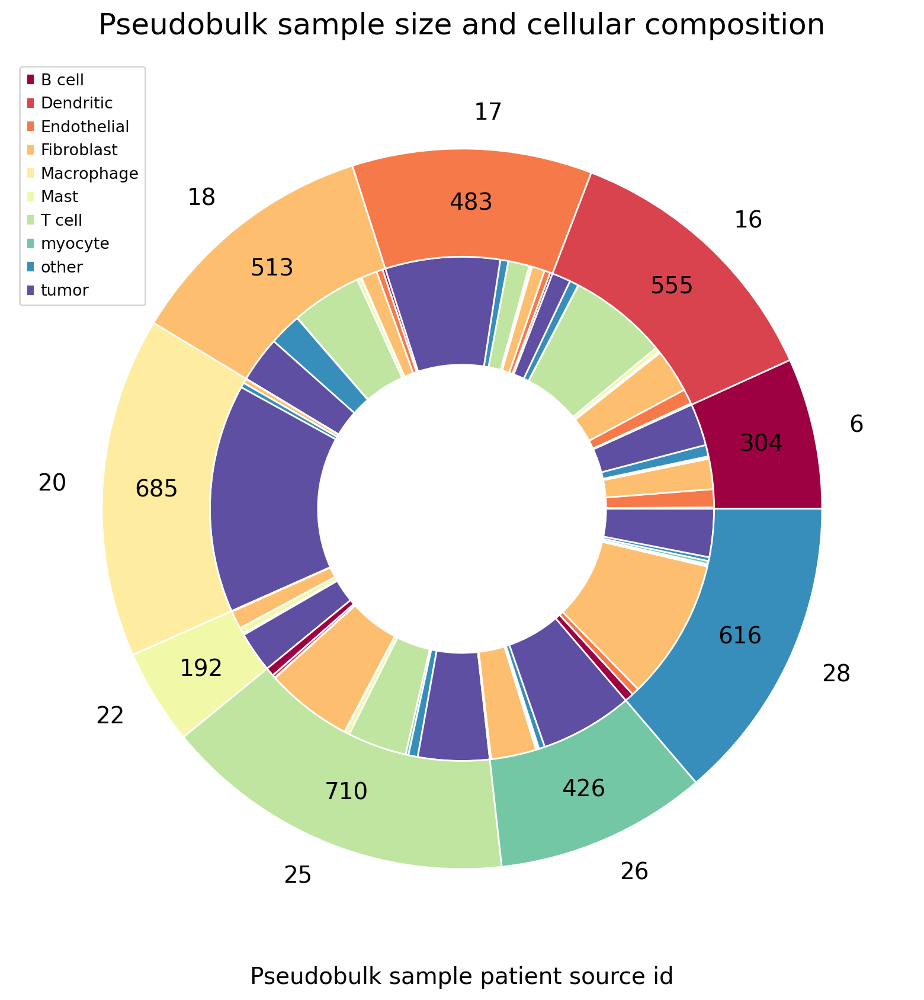

In [96]:
fig, ax = plt.subplots(figsize=(10,10))
ax.set_title('Pseudobulk sample size and cellular composition', fontsize=18, pad=15)

size = 0.3
colors = ['dimgrey', 'lightcoral','chocolate','darkorange', 'gold', 'yellowgreen', 'lawngreen',
                    'green','aquamarine', ]
colors_celltype = []

colors = [plt.cm.Spectral(i) for i in np.linspace(0, 1, 10)]
ax.set_prop_cycle('color', colors)
ax.pie(group_celltype['Cell_type'],radius=1-size,wedgeprops=dict(width=size,edgecolor='w')
      )

ax.pie(group_celltype.groupby('batch')['Cell_type'].sum(),radius=1,wedgeprops=dict(width=size,edgecolor='w'),
       labels = merge_sample['batch'].value_counts(sort=False).index.tolist(),autopct=lambda x: '{:.0f}'.format(x*merge_sample['batch'].value_counts().sum()/100),
      pctdistance=0.85,colors = colors)

ax.legend(group_celltype['label'].value_counts().index,fontsize='x-small')
ax.set_xlabel("Pseudobulk sample patient source id")
plt.show()

In [88]:
merge_sample[merge_sample['batch']==20]['Cell_type'].value_counts()

tumor          657
other           14
Fibroblast      13
Endothelial      1
B cell           0
Dendritic        0
Macrophage       0
Mast             0
T cell           0
myocyte          0
Name: Cell_type, dtype: int64

In [109]:
# use 5 largest as training set (68.7%), remaining smaller samples as test set  
(merge_sample['batch'].value_counts()[:5]/merge_sample['batch'].value_counts().sum()).sum()

0.686663693131133

In [110]:
merge_sample['batch'].value_counts()

25    710
20    685
28    616
16    555
18    513
17    483
26    426
6     304
22    192
Name: batch, dtype: int64

<AxesSubplot:title={'center':'All'}, ylabel='No. of single cells in all samples'>

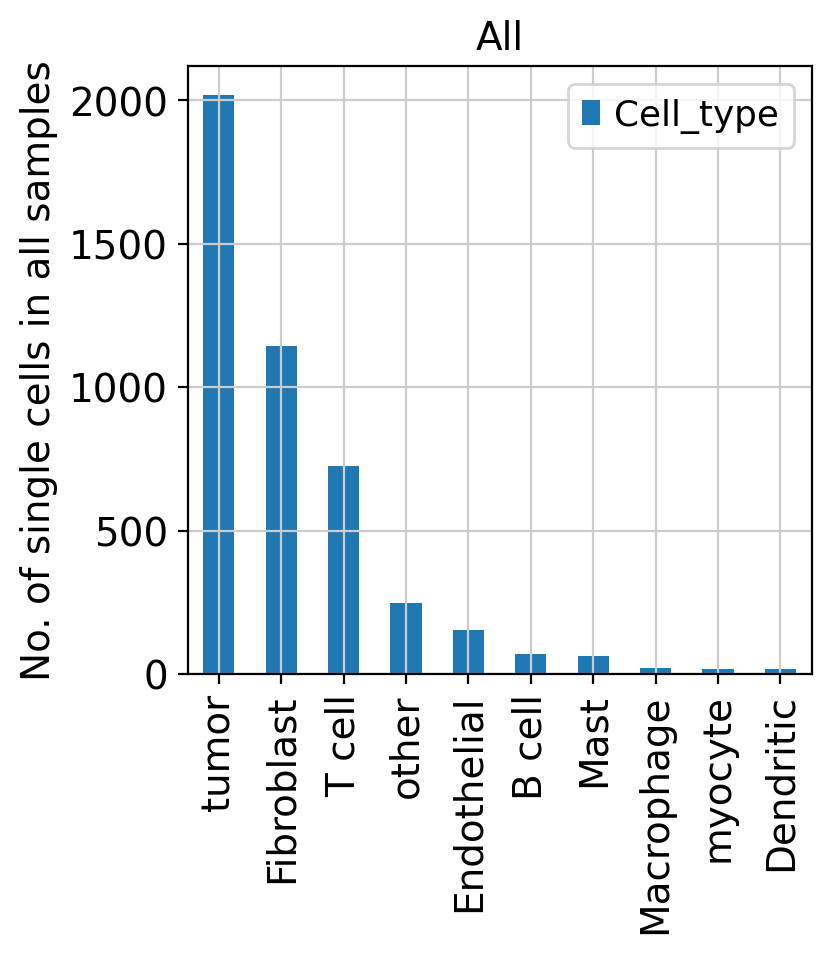

In [262]:
#composition of cell types in pseudo bulk samples
pd.DataFrame(merge_sample['Cell_type'].value_counts()).plot(y='Cell_type',kind='bar',title = 'All',ylabel='No. of single cells in all samples',stacked=True,)

<AxesSubplot:title={'center':'sample 25'}, ylabel='No. of single cells in pseudobulk sample'>

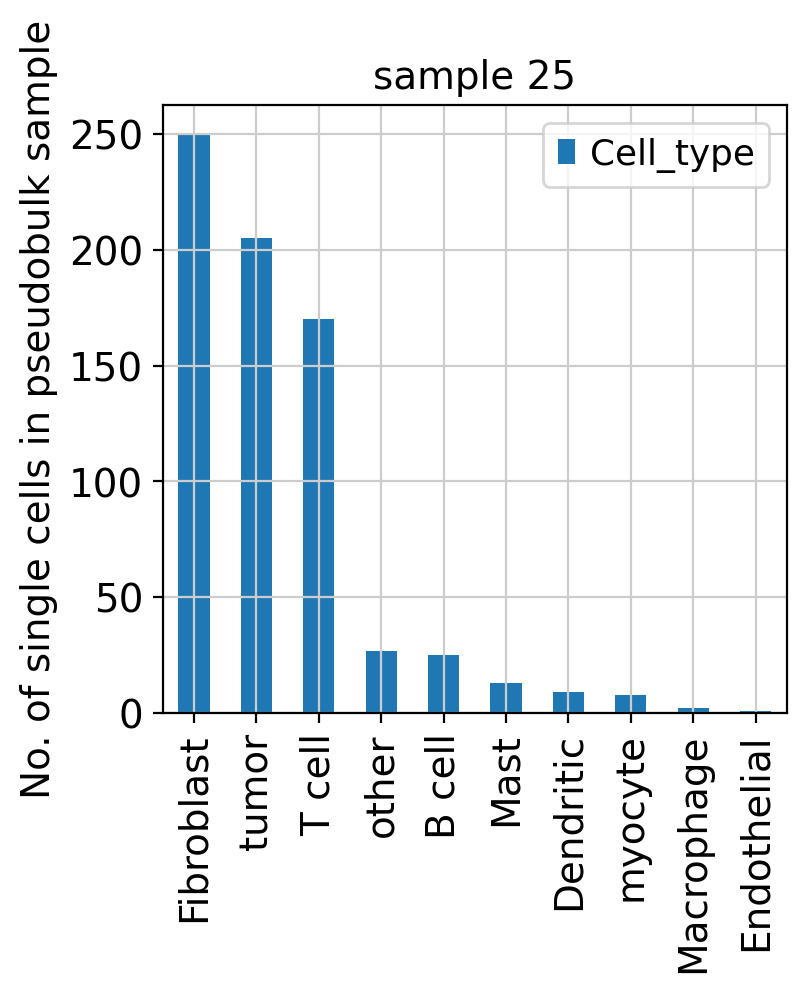

In [264]:
pd.DataFrame(merge_sample[merge_sample['batch']==25]['Cell_type'].value_counts()).plot(y='Cell_type',kind='bar',title = 'sample 25',ylabel='No. of single cells in pseudobulk sample')

<AxesSubplot:title={'center':'sample 16'}, ylabel='No. of single cells in pseudobulk sample'>

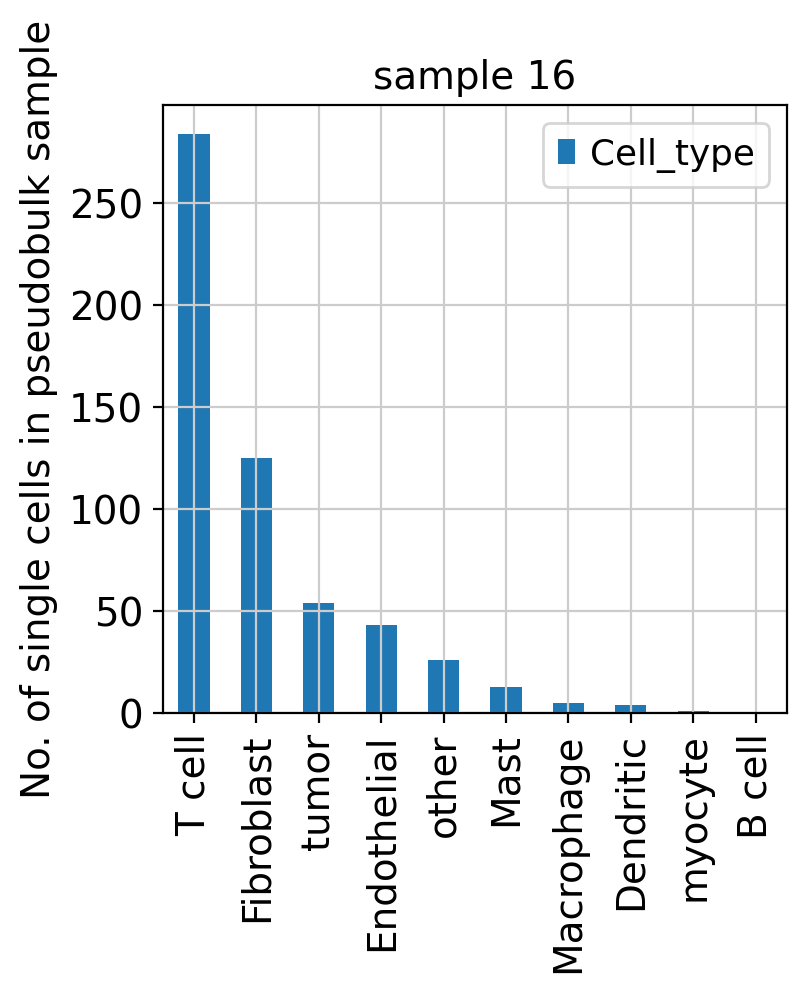

In [266]:
pd.DataFrame(merge_sample[merge_sample['batch']==16]['Cell_type'].value_counts()).plot(y='Cell_type',kind='bar',title = 'sample 16',ylabel='No. of single cells in pseudobulk sample')

In [13]:
table_celltype_count = merge_sample.groupby(['batch'], as_index=False)['Cell_type'].value_counts()
table_celltype_count

,batch,Cell_type,count
0,6,tumor,121
1,6,Fibroblast,87
2,6,Endothelial,52
3,6,other,33
4,6,Macrophage,6
...,...,...,...
85,28,myocyte,9
86,28,T cell,4
87,28,Macrophage,2
88,28,Mast,1


In [14]:
True_pseudobulk_prop = table_celltype_count.pivot(columns='Cell_type',index='batch',values='count')
True_pseudobulk_prop = True_pseudobulk_prop.div(True_pseudobulk_prop.sum(axis=1), axis=0)
True_pseudobulk_prop

Cell_type,B cell,Dendritic,Endothelial,Fibroblast,Macrophage,Mast,T cell,myocyte,other,tumor
batch,,,,,,,,,,
6,0.013158,0.000000,0.171053,0.286184,0.019737,0.003289,0.000000,0.000000,0.108553,0.398026
16,0.000000,0.007207,0.077477,0.225225,0.009009,0.023423,0.511712,0.001802,0.046847,0.097297
17,0.014493,0.000000,0.035197,0.076605,0.004141,0.012422,0.126294,0.000000,0.047619,0.683230
18,0.015595,0.000000,0.035088,0.089669,0.003899,0.021442,0.393762,0.001949,0.181287,0.257310
20,0.000000,0.000000,0.001460,0.018978,0.000000,0.000000,0.000000,0.000000,0.020438,0.959124
22,0.000000,0.005208,0.005208,0.270833,0.000000,0.093750,0.000000,0.000000,0.020833,0.604167
25,0.035211,0.012676,0.001408,0.352113,0.002817,0.018310,0.239437,0.011268,0.038028,0.288732
26,0.002347,0.007042,0.000000,0.305164,0.007042,0.002347,0.011737,0.000000,0.039906,0.624413
28,0.042208,0.000000,0.034091,0.655844,0.003247,0.001623,0.006494,0.014610,0.017857,0.224026


<AxesSubplot:xlabel='batch', ylabel='Cell_type'>

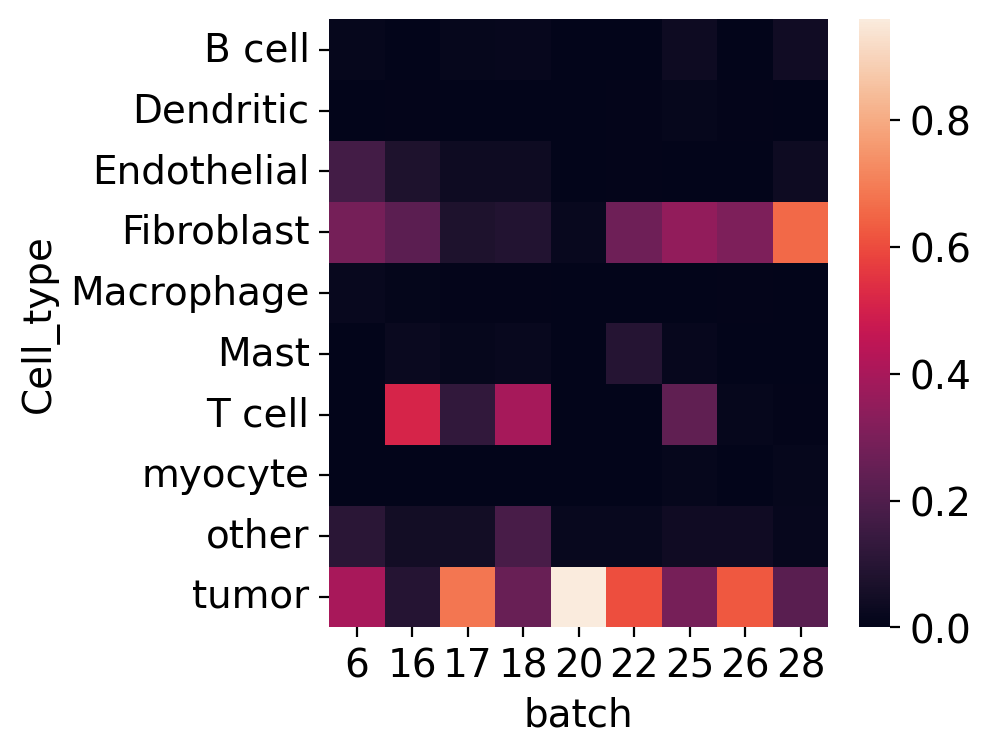

In [15]:
#cell type compostion by samples
sns.heatmap(True_pseudobulk_prop.T)

In [16]:
True_pseudobulk_prop.sum(axis=1)
# check sum of props to be 100% for each cell type

batch
6     1.0
16    1.0
17    1.0
18    1.0
20    1.0
22    1.0
25    1.0
26    1.0
28    1.0
dtype: float64

In [272]:
True_pseudobulk_prop.to_csv("/home/cke/Puram/Puram_pseudobulk_prop_fromraw.tsv",sep='\t')

## DE

In [17]:
"""
Finding marker genes
compute a ranking for the highly differential genes in each cluster
each rank genes run overwrites existing run!
"""
# must be done on highly variable gene subsets otherwise topDEGs have too low exp vs other cell types
sc.settings.verbosity = 2  # reduce the verbosity

In [18]:
Puram_adata

AnnData object with n_obs × n_vars = 4484 × 5009
    obs: 'Cell_type', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'n_genes', 'doublet_scores', 'predicted_doublets', 'doublet_info'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'doublet_info_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'tsne', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [19]:
Puram_adata.obs

,Cell_type,batch,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt2,n_counts,n_genes,doublet_scores,predicted_doublets,doublet_info
HN28_P15_D06_S330_comb,Fibroblast,28,4286,1.000009e+06,0.0,0.0,86613.296875,8.661255,76.009735,0.007601,0.0,998772.7500,4286,0.001839,False,False
HN28_P6_G05_S173_comb,Fibroblast,28,2723,1.000014e+06,0.0,0.0,149693.578125,14.969142,0.000000,0.000000,0.0,998379.7500,2723,0.001245,False,False
HN26_P14_D11_S239_comb,tumor,26,6965,9.999924e+05,0.0,0.0,186097.953125,18.609936,48.559368,0.004856,0.0,999708.2500,6965,0.000950,False,False
HN26_P14_H05_S281_comb,Fibroblast,26,3451,1.000007e+06,0.0,0.0,132006.796875,13.200584,1.369982,0.000137,0.0,998924.0000,3451,0.004927,False,False
HN26_P25_H09_S189_comb,tumor,26,7355,1.000015e+06,0.0,0.0,187427.015625,18.742414,40.318760,0.004032,0.0,999479.3750,7355,0.000880,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HNSCC17_P4_G12_S180_comb,other,17,4801,1.000001e+06,0.0,0.0,88164.929688,8.816483,0.000000,0.000000,0.0,996694.6875,4801,0.006500,False,False
HNSCC20_P13_C05_S221_comb,tumor,20,5788,1.000003e+06,0.0,0.0,125418.648438,12.541826,0.000000,0.000000,0.0,997012.5000,5788,0.003883,False,False
HNSCC17_P4_C12_S132_comb,tumor,17,5375,9.999812e+05,0.0,0.0,113774.828125,11.377696,40.110050,0.004011,0.0,999734.4375,5375,0.002911,False,False
HNSCC20_P3_H08_S92_comb,tumor,20,5666,1.000019e+06,0.0,0.0,86069.804688,8.606817,0.000000,0.000000,0.0,998648.0625,5666,0.001572,False,False


ranking genes
    finished (0:00:24)


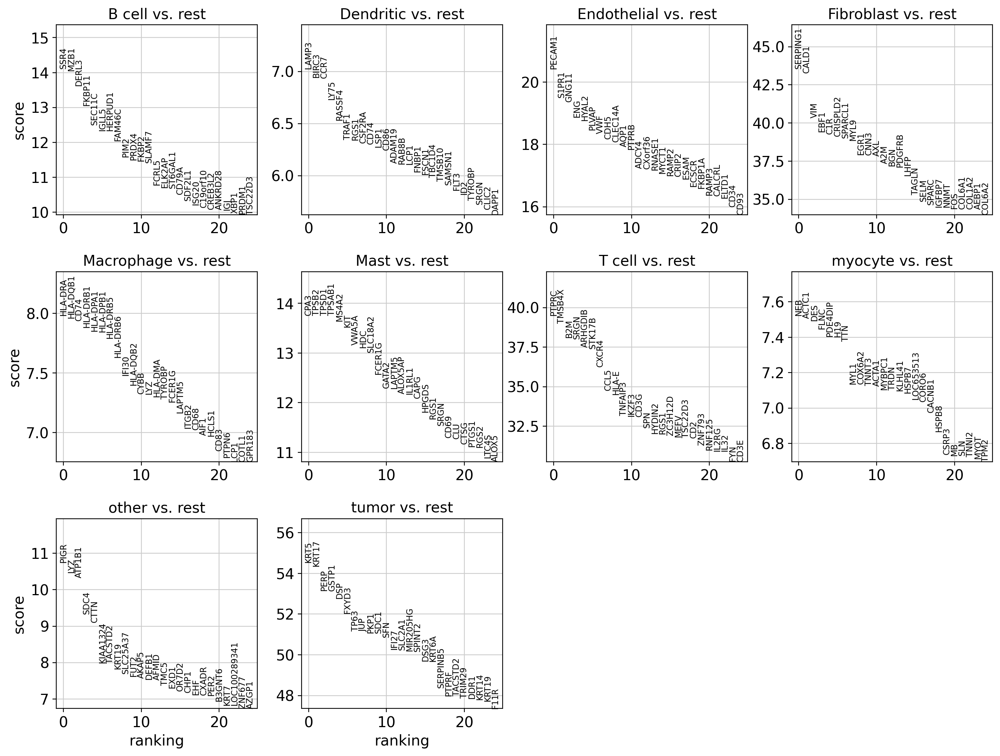

In [21]:
# wilcoxon rank-sum test result
# for cell types
sc.tl.rank_genes_groups(Puram_adata, 'Cell_type', method='wilcoxon')
sc.pl.rank_genes_groups(Puram_adata, n_genes=25, sharey=False)

In [22]:
pd.DataFrame(Puram_adata.uns['rank_genes_groups']['scores'])

,B cell,Dendritic,Endothelial,Fibroblast,Macrophage,Mast,T cell,myocyte,other,tumor
0,14.109898,7.026286,20.430511,43.556183,7.980515,13.753589,39.492218,7.521616,10.747506,54.530727
1,14.054221,6.943695,19.495777,43.277088,7.957897,13.752908,38.990292,7.504745,10.464463,54.346893
2,13.625906,6.936187,19.372541,40.319508,7.938086,13.752810,38.104305,7.493202,10.324242,53.148205
3,13.051770,6.729335,18.872757,39.416782,7.880963,13.752325,38.003735,7.445075,9.331206,53.125587
4,12.499027,6.530649,18.770426,39.261066,7.848770,13.642038,37.493069,7.404761,9.101179,52.765026
...,...,...,...,...,...,...,...,...,...,...
21191,-10.282372,-4.841300,-11.273385,-33.063564,-4.767359,-8.892533,-36.043510,-5.729009,-9.053160,-33.479485
21192,-10.971279,-4.937686,-11.450020,-33.635303,-4.890602,-9.342334,-36.345207,-5.861670,-9.057374,-34.680027
21193,-11.478326,-5.037358,-14.108913,-33.810642,-5.129659,-9.993061,-36.458195,-6.249352,-9.161839,-34.806602
21194,-11.824951,-5.286631,-14.343223,-34.828121,-5.252903,-10.489495,-37.122150,-6.414423,-9.858787,-36.515160


In [23]:
# genes ranked by differential expression in each pre defined cell types, based on wilcoxon
# a table with the z-scores and cell types.
result = Puram_adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
DEGs_celltype_wilcoxon = pd.DataFrame(
    {group + '_' + key: result[key][group]
    for group in groups for key in ['names', 'scores']})
DEGs_celltype_wilcoxon

,B cell_names,B cell_scores,Dendritic_names,Dendritic_scores,Endothelial_names,Endothelial_scores,Fibroblast_names,Fibroblast_scores,Macrophage_names,Macrophage_scores,Mast_names,Mast_scores,T cell_names,T cell_scores,myocyte_names,myocyte_scores,other_names,other_scores,tumor_names,tumor_scores
0,SSR4,14.109898,LAMP3,7.026286,PECAM1,20.430511,SERPING1,43.556183,HLA-DRA,7.980515,CPA3,13.753589,PTPRC,39.492218,NEB,7.521616,PIGR,10.747506,KRT5,54.530727
1,MZB1,14.054221,BIRC3,6.943695,S1PR1,19.495777,CALD1,43.277088,HLA-DQB1,7.957897,TPSB2,13.752908,TMSB4X,38.990292,ACTC1,7.504745,LYZ,10.464463,KRT17,54.346893
2,DERL3,13.625906,CCR7,6.936187,GNG11,19.372541,VIM,40.319508,CD74,7.938086,TPSD1,13.752810,B2M,38.104305,DES,7.493202,ATP1B1,10.324242,PERP,53.148205
3,FKBP11,13.051770,LY75,6.729335,ENG,18.872757,EBF1,39.416782,HLA-DRB1,7.880963,TPSAB1,13.752325,SRGN,38.003735,FLNC,7.445075,SDC4,9.331206,GSTP1,53.125587
4,SEC11C,12.499027,RASSF4,6.530649,HYAL2,18.770426,C1R,39.261066,HLA-DPA1,7.848770,MS4A2,13.642038,ARHGDIB,37.493069,PDE4DIP,7.404761,CTTN,9.101179,DSP,52.765026
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21191,MYL12B,-10.282372,IFI6,-4.841300,GPNMB,-11.273385,SPINT2,-33.063564,SYNE2,-4.767359,GSTP1,-8.892533,HSPB1,-36.043510,MYL6,-5.729009,GAPDH,-9.053160,IKZF3,-33.479485
21192,ANXA1,-10.971279,CTTN,-4.937686,PTPRS,-11.450020,DSG3,-33.635303,PERP,-4.890602,GAPDH,-9.342334,CST3,-36.345207,TMSB10,-5.861670,VIM,-9.057374,SPN,-34.680027
21193,ACTB,-11.478326,LMNA,-5.037358,FTH1,-14.108913,DSC3,-33.810642,EMP2,-5.129659,CTTN,-9.993061,CD9,-36.458195,PTMA,-6.249352,FLNA,-9.161839,JUNB,-34.806602
21194,FTH1,-11.824951,IFITM3,-5.286631,LGALS3BP,-14.343223,EZR,-34.828121,ENAH,-5.252903,GLG1,-10.489495,CTTN,-37.122150,ACTB,-6.414423,MSN,-9.858787,VIM,-36.515160


In [24]:
# extract top N DEGs from each cell types
n = 50 
marker_genes = pd.DataFrame()
list_marker_genes = []
for col,gene in DEGs_celltype_wilcoxon[0:n].iteritems():
    if 'names' in col:
        list_marker_genes.extend(gene.tolist())
        marker_genes = pd.concat([marker_genes,gene],axis=1)
        print('detected all',len(gene),' top DEGs in ',col)

detected all 50  top DEGs in  B cell_names
detected all 50  top DEGs in  Dendritic_names
detected all 50  top DEGs in  Endothelial_names
detected all 50  top DEGs in  Fibroblast_names
detected all 50  top DEGs in  Macrophage_names
detected all 50  top DEGs in  Mast_names
detected all 50  top DEGs in  T cell_names
detected all 50  top DEGs in  myocyte_names
detected all 50  top DEGs in  other_names
detected all 50  top DEGs in  tumor_names


In [25]:
marker_genes

,B cell_names,Dendritic_names,Endothelial_names,Fibroblast_names,Macrophage_names,Mast_names,T cell_names,myocyte_names,other_names,tumor_names
0,SSR4,LAMP3,PECAM1,SERPING1,HLA-DRA,CPA3,PTPRC,NEB,PIGR,KRT5
1,MZB1,BIRC3,S1PR1,CALD1,HLA-DQB1,TPSB2,TMSB4X,ACTC1,LYZ,KRT17
2,DERL3,CCR7,GNG11,VIM,CD74,TPSD1,B2M,DES,ATP1B1,PERP
3,FKBP11,LY75,ENG,EBF1,HLA-DRB1,TPSAB1,SRGN,FLNC,SDC4,GSTP1
4,SEC11C,RASSF4,HYAL2,C1R,HLA-DPA1,MS4A2,ARHGDIB,PDE4DIP,CTTN,DSP
5,IGLL5,TRAF1,PLVAP,CRISPLD2,HLA-DPB1,KIT,STK17B,H19,KIAA1324,FXYD3
6,HERPUD1,RGS1,VWF,SPARCL1,HLA-DRB5,VWA5A,CXCR4,TTN,TACSTD2,TP63
7,FAM46C,CSF2RA,CDH5,MYL9,HLA-DRB6,HDC,CCL5,MYL1,KRT19,JUP
8,PIM2,CD74,CLEC14A,EGR1,IFI30,SLC18A2,HLA-E,COX6A2,SLC25A37,PKP1
9,PRDX4,LSP1,AQP1,CNN3,HLA-DQB2,FCER1G,TNFAIP3,TNNT3,FUT2,SDC1


In [26]:
set(list_marker_genes)

{'A2M',
 'ACTA1',
 'ACTA2',
 'ACTC1',
 'ACTN2',
 'ADAM19',
 'ADAMTS1',
 'ADCK3',
 'ADCY4',
 'ADRBK2',
 'AEBP1',
 'AFMID',
 'AIF1',
 'AKAP13',
 'AKAP5',
 'ALDOA',
 'ALOX5',
 'ALOX5AP',
 'ANKRD28',
 'ANXA1',
 'ANXA2',
 'AQP1',
 'AREG',
 'ARHGAP18',
 'ARHGAP29',
 'ARHGDIB',
 'ARHGEF6',
 'ATCAY',
 'ATP1B1',
 'AXL',
 'AZGP1',
 'B2M',
 'B3GNT6',
 'BAG1',
 'BGN',
 'BIN1',
 'BIRC3',
 'BTG1',
 'C16orf54',
 'C19orf10',
 'C1R',
 'C1S',
 'C1orf186',
 'C21orf62',
 'C4A',
 'C4B',
 'CA3',
 'CACNB1',
 'CALCRL',
 'CALD1',
 'CALML3',
 'CAPG',
 'CCL22',
 'CCL5',
 'CCR7',
 'CD2',
 'CD34',
 'CD3E',
 'CD3G',
 'CD53',
 'CD59',
 'CD68',
 'CD69',
 'CD74',
 'CD79A',
 'CD82',
 'CD83',
 'CD84',
 'CD86',
 'CD93',
 'CD96',
 'CDH1',
 'CDH3',
 'CDH5',
 'CEACAM5',
 'CECR1',
 'CFI',
 'CGNL1',
 'CHDH',
 'CHP1',
 'CHRM3',
 'CHST6',
 'CKM',
 'CLCA2',
 'CLDN11',
 'CLDN5',
 'CLEC14A',
 'CLIC2',
 'CLU',
 'CMYA5',
 'CNN3',
 'COL15A1',
 'COL1A1',
 'COL1A2',
 'COL3A1',
 'COL6A1',
 'COL6A2',
 'CORO6',
 'COTL1',
 'COX6A2',
 'COX7

In [27]:
len(list_marker_genes)

500

In [28]:
len(set(list_marker_genes))

458

In [29]:
marker_genes.to_csv("./Puram/top50DEGs_pseudobulk.csv")

In [318]:
DEGs_celltype_wilcoxon.to_csv("./Puram/DEGscore_celltype_Puram_wilcoxon.csv")

In [30]:
# writing a list of all DEGs
import csv
with open("./Puram/top50DEGs_pseudobulk.txt",'w') as f:
    write = csv.writer(f)
    write.writerow(set(list_marker_genes))

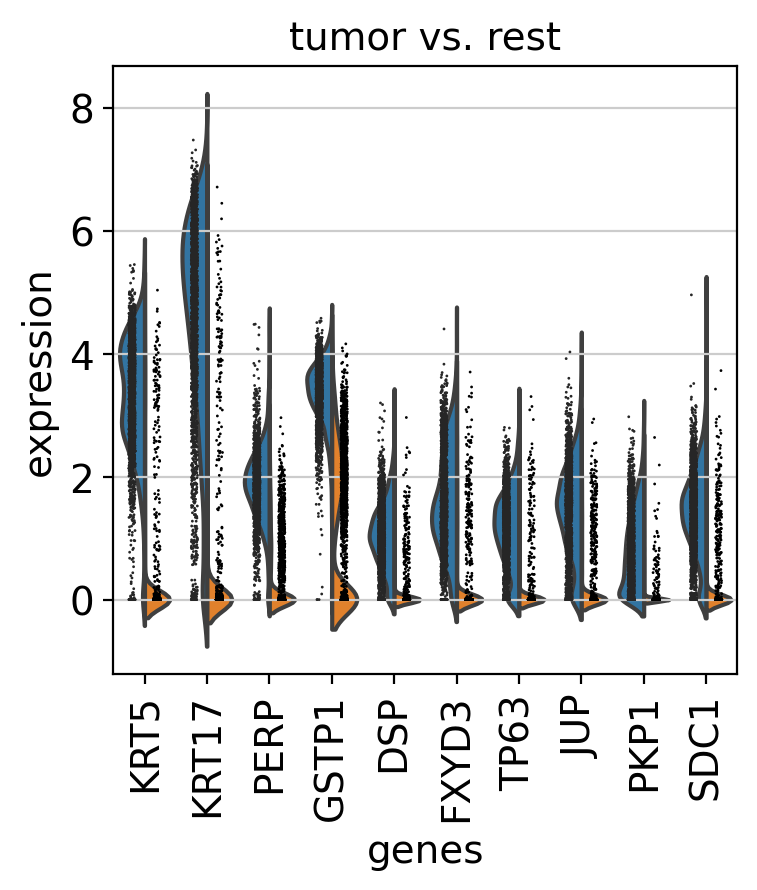

In [31]:
# a more detailed of DEGs look into certain group
sc.pl.rank_genes_groups_violin(Puram_adata, groups='tumor', n_genes=10)

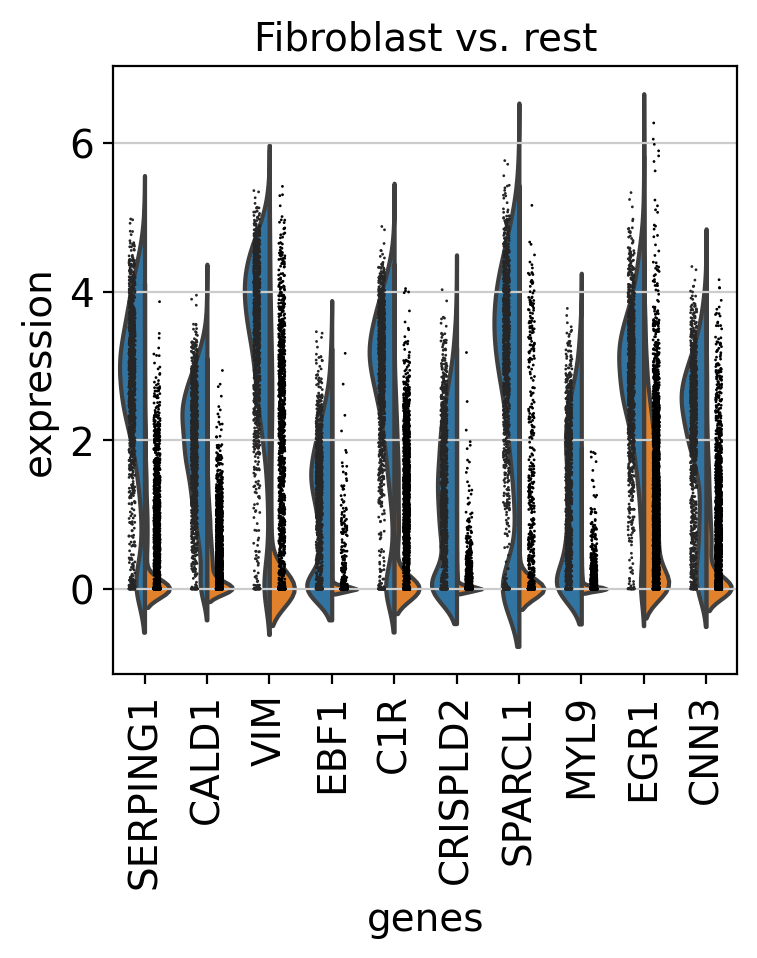

In [322]:
sc.pl.rank_genes_groups_violin(Puram_adata, groups='Fibroblast', n_genes=10)

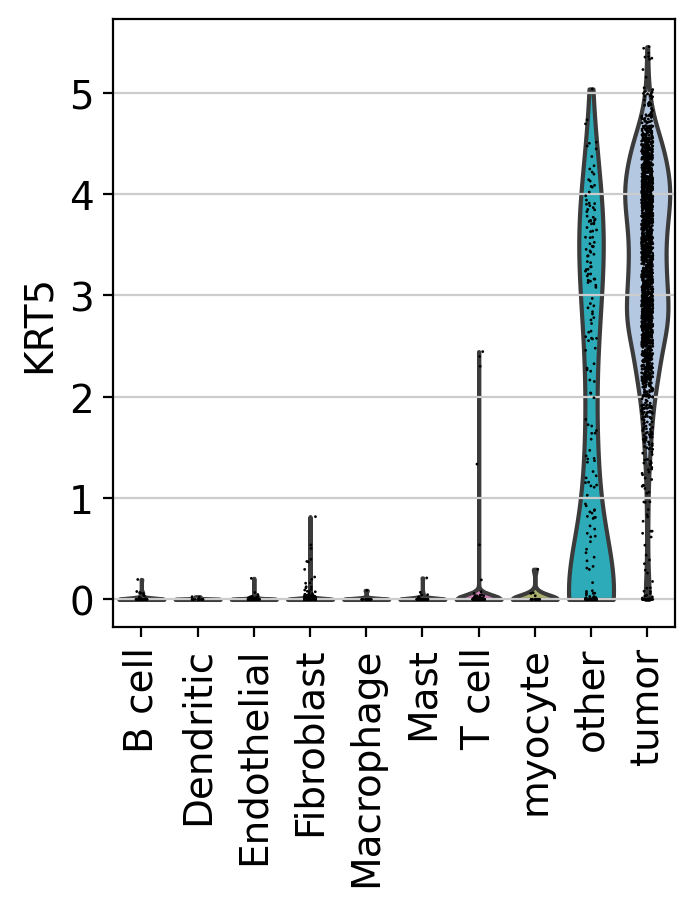

In [282]:
# compare a certain gene across groups
# the gene here is the most DEG in tumor
sc.pl.violin(Puram_adata, ['KRT5'], groupby='Cell_type',rotation=90)

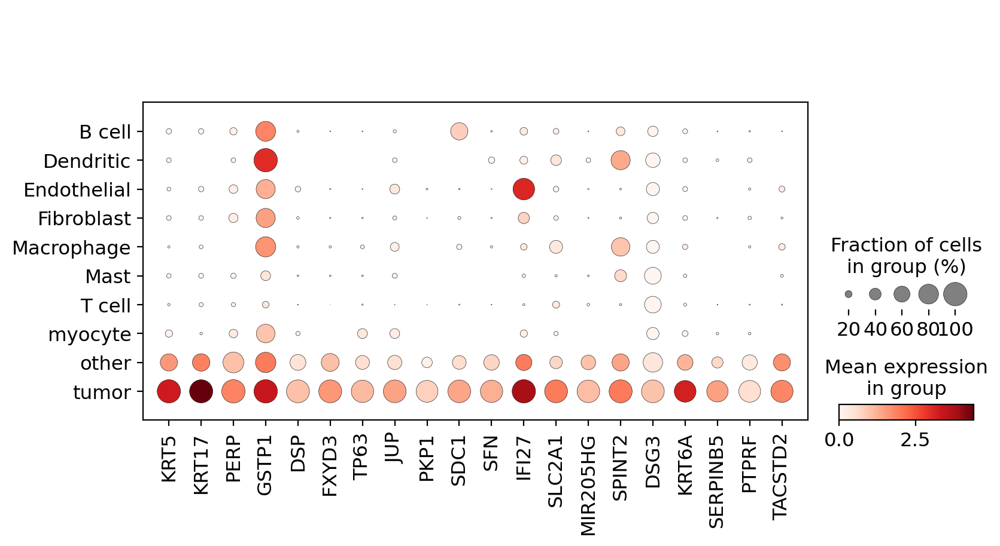

In [297]:
# visualize marker genes
# 20 DEGs from tumor
sc.pl.dotplot(Puram_adata, list_marker_genes[-100:-80], groupby='Cell_type')

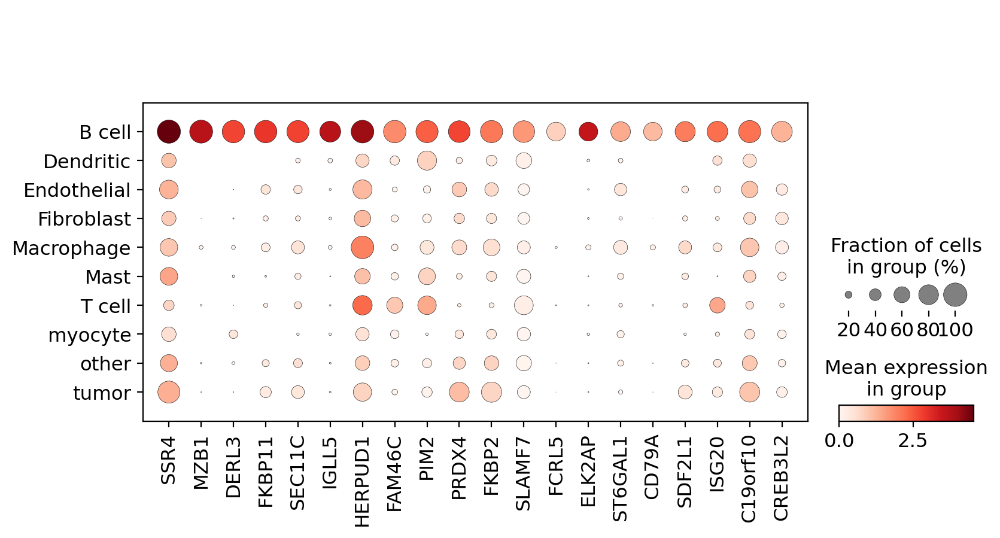

In [298]:
# visualize marker genes
# 20 DEGs from B cell
sc.pl.dotplot(Puram_adata, list_marker_genes[:20], groupby='Cell_type')

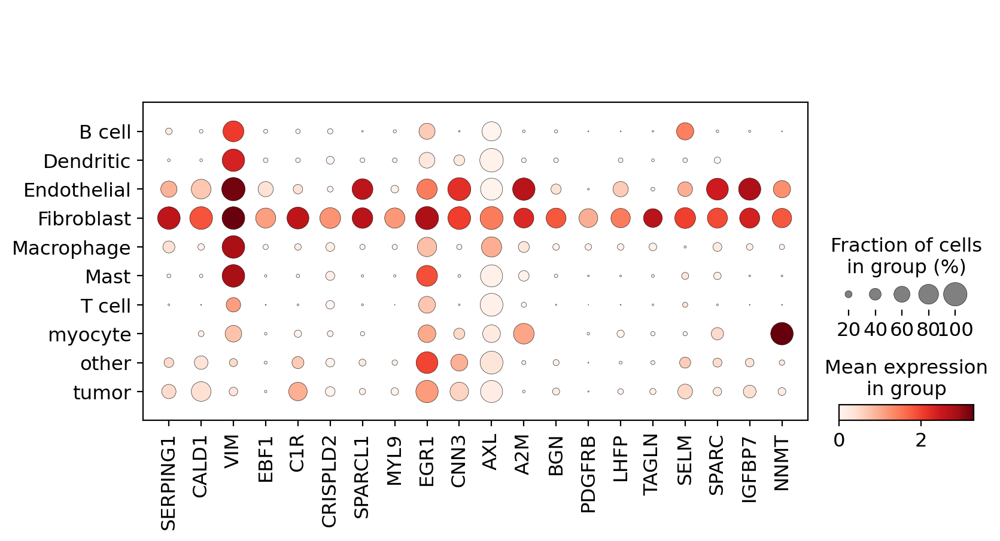

In [299]:
# visualize marker genes
# 20 DEGs from Fibroblast
sc.pl.dotplot(Puram_adata, list_marker_genes[300:320], groupby='Cell_type')

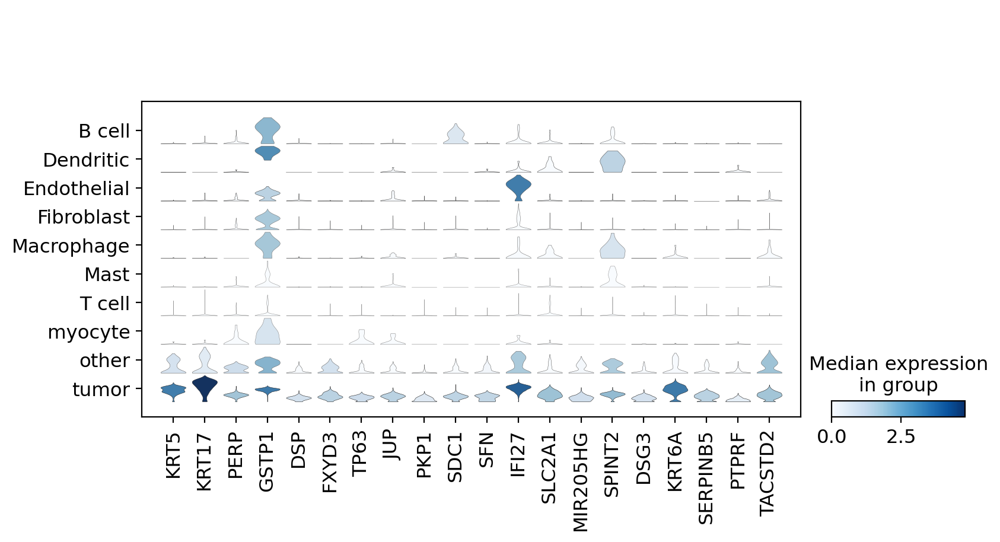

In [300]:
# tumor 20 DEGs in violin plot
sc.pl.stacked_violin(Puram_adata, list_marker_genes[-100:-80], groupby='Cell_type', rotation=90);